# Simple Model 1

In [167]:
# %load_ext autoreload
%autoreload 2
%reload_ext autoreload
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import geopandas
import geopy
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import linear_rainbow, het_breuschpagan
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import mean_squared_error, make_scorer
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import folium.plugins as plugins
import math
from math import sin, cos, sqrt, atan2, radians
from haversine import haversine
from itertools import combinations
import json
%matplotlib inline
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 200)
import sys
import os
path_to_src = os.path.join('..\..', 'src')
sys.path.insert(0, path_to_src)
from useful_functions import *


In [168]:
df = pd.read_csv('..\..\data\processed\cleaned_data.csv')
len(df)

15851

In [169]:
# create a simple linear model with just one independent variable
# As single feature need to reshape X_train into column vector
df1 = df.copy()
X_train = np.array(df1['SqFtTotLiving']).reshape(-1,1)
y_train = df1['SalePrice']

In [170]:
X_int = sm.add_constant(X_train)
model = sm.OLS(y_train, X_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.389
Model:                            OLS   Adj. R-squared:                  0.389
Method:                 Least Squares   F-statistic:                 1.010e+04
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:53:56   Log-Likelihood:            -2.2843e+05
No. Observations:               15851   AIC:                         4.569e+05
Df Residuals:                   15849   BIC:                         4.569e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9291.9955   8504.112     -1.093      0.275    -2.6e+04    7377.030
x1           374.8940      3.730    100.509      0.000     367.583     382.205
==============================================================================
Omnibus:                    19945.027   Durbin-Watson:                   0.685
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          9825842.224
Skew:                           6.470   Prob(JB):                         0.00
Kurtosis:                     124.284   Cond. No.                     5.56e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.56e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Ok so there are issues with this model of course, only a single feature has been used. It still manages to explain 39% of the variance in SalePrice, which I'm actually surprised at - this suggests the total square footage of living space is an important factor in house prices - perhaps this is less surprising!

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


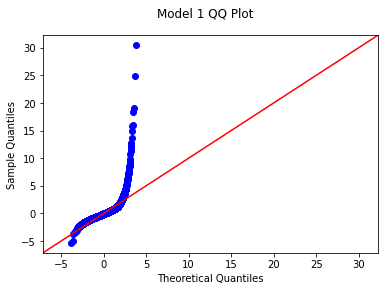

In [171]:
get_qq(model, 'Model 1')

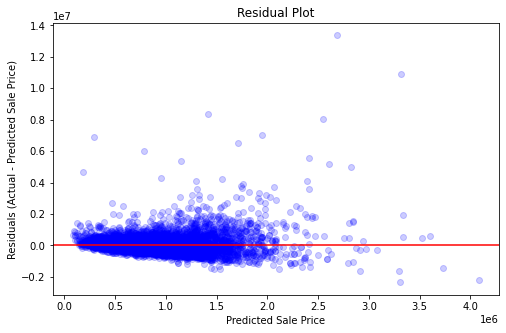

In [172]:
get_resid(df1, model)

In [173]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg.fit(X_train, y_train)

scores = cross_val_score(
            linreg, 
            X_train,
            y_train,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores = np.sqrt(-scores)
display(rmse_scores)
display(rmse_scores.mean())
display(rmse_scores.std())

array([ 273996.8099302 ,  262073.65662739,  298476.26954476,
        306525.03804902,  290063.51526738,  256734.93056669,
        270496.02301345,  273578.29343339,  330007.16912153,
       1424165.40108199])

398611.71066358173

342506.0943804986

In [174]:
# Define table as a dataframe with specific columns. Each column's values will be a list that we will add to.
summary = pd.DataFrame({'Model': [], 'Description':[], ' No. Features' : [], 'R^2':[],
                                'Adj R^2':[], 'RMSE': [],'RMSE sd':[], 'JB':[]})

# Add data for simple linear regression
summary.loc[0] = ['Simple Model - one independent variable', 'Square ft Total living', model.df_model, round(model.rsquared,3)\
                  , round(model.rsquared_adj,3), int(rmse_scores.mean()), int(rmse_scores.std()), round((sms.jarque_bera(model.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0


It is pretty clear that this model violates the assumptions that residuals are normally distributed. This is also reflected with the extremely high JB number. The mean squared error is also very high, 398,611USD meaning that on average the house price predicted by the model could be +/- 400k USD away from the actual value - not the best. 

I will remove outliers from this model to try and improve these metrics.

# Simple Model 2 (outliers removed)

In [175]:
df2 = df.copy()
df2 = drop_outliers(df2, 'SalePrice', 3)
df2 = drop_outliers(df2, 'SqFtTotLiving', 3)

In [176]:
X_train2 = np.array(df2['SqFtTotLiving']).reshape(-1,1)
y_train2 = df2['SalePrice']

In [177]:
X_int2 = sm.add_constant(X_train2)
model2 = sm.OLS(y_train2, X_int2).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.354
Model:                            OLS   Adj. R-squared:                  0.354
Method:                 Least Squares   F-statistic:                     8444.
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:54:00   Log-Likelihood:            -2.1568e+05
No. Observations:               15411   AIC:                         4.314e+05
Df Residuals:                   15409   BIC:                         4.314e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.671e+05   6371.126     26.230      0.000    1.55e+05     1.8e+05
x1           272.4155      2.965     91.893      0.000     266.605     278.226
==============================================================================
Omnibus:                     2916.013   Durbin-Watson:                   0.678
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7132.340
Skew:                           1.055   Prob(JB):                         0.00
Kurtosis:                       5.579   Cond. No.                     5.87e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.87e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


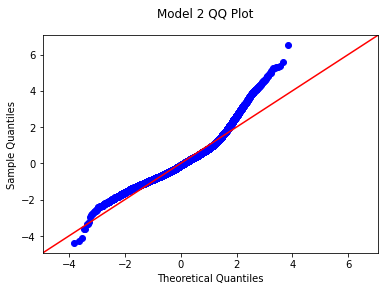

In [178]:
get_qq(model2, 'Model 2')

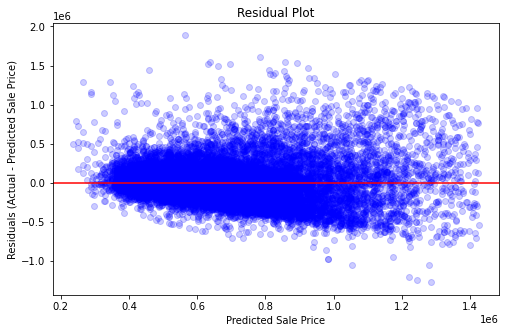

In [179]:
get_resid(df2, model2)

In [180]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg2 = linreg.fit(X_train2, y_train2)

scores2 = cross_val_score(
            linreg2, 
            X_train2,
            y_train2,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores2 = np.sqrt(-scores2)
display(rmse_scores2)
display(rmse_scores2.mean())
display(rmse_scores2.std())

array([295321.18953263, 249736.38151031, 258494.96890691, 245105.5103492 ,
       227426.37390392, 184883.81296618, 199095.84250856, 214193.43679246,
       279496.28324522, 792045.29417882])

294579.90938941936

168991.91647047078

In [181]:
summary.loc[1] = ['Simple Model - outliers removed', 'Square ft Total living', model2.df_model, round(model2.rsquared,3)\
                  , round(model2.rsquared_adj,3), int(rmse_scores2.mean()), int(rmse_scores2.std()), round((sms.jarque_bera(model2.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0


Interesting that the R-squared value reduced, but the JB number has reduced significantly, and checking the qq plot it appears to be somewhat honouring residuals normality assumption to some extent, certainly better than previously. It is not honouring the homoscedasticity assumption.

# Model 3 - Adding Features

Before adding new features, its important to check that they are have a linear relationship with SalePrice. This can be checked visually by plotting each potential feature vs SalePrice

In [182]:
# work from the dataframe that had outliers in price and sqfttotliving removed 
df3 = df2.copy()
df3.drop(columns=['Unnamed: 0'], inplace=True)

In [183]:
df3.columns

Index(['Address', 'BuildingNumber', 'DirectionPrefix', 'StreetName',
       'StreetType', 'DirectionSuffix', 'ZipCode', 'Stories', 'BldgGrade',
       'SqFt1stFloor', 'SqFtHalfFloor', 'SqFt2ndFloor', 'SqFtUpperFloor',
       'SqFtTotLiving', 'SqFtTotBasement', 'SqFtFinBasement',
       'FinBasementGrade', 'SqFtGarageBasement', 'SqFtGarageAttached',
       'DaylightBasement', 'SqFtOpenPorch', 'SqFtEnclosedPorch', 'SqFtDeck',
       'HeatSystem', 'HeatSource', 'BrickStone', 'ViewUtilization', 'Bedrooms',
       'BathHalfCount', 'Bath3qtrCount', 'BathFullCount', 'YrBuilt',
       'YrRenovated', 'Condition', 'id', 'Township', 'Section',
       'QuarterSection', 'Area', 'DistrictName', 'SqFtLot', 'Access',
       'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView', 'WfntLocation',
       'TrafficNoise', 'PowerLines', 'OtherNuisances', 'Adjace

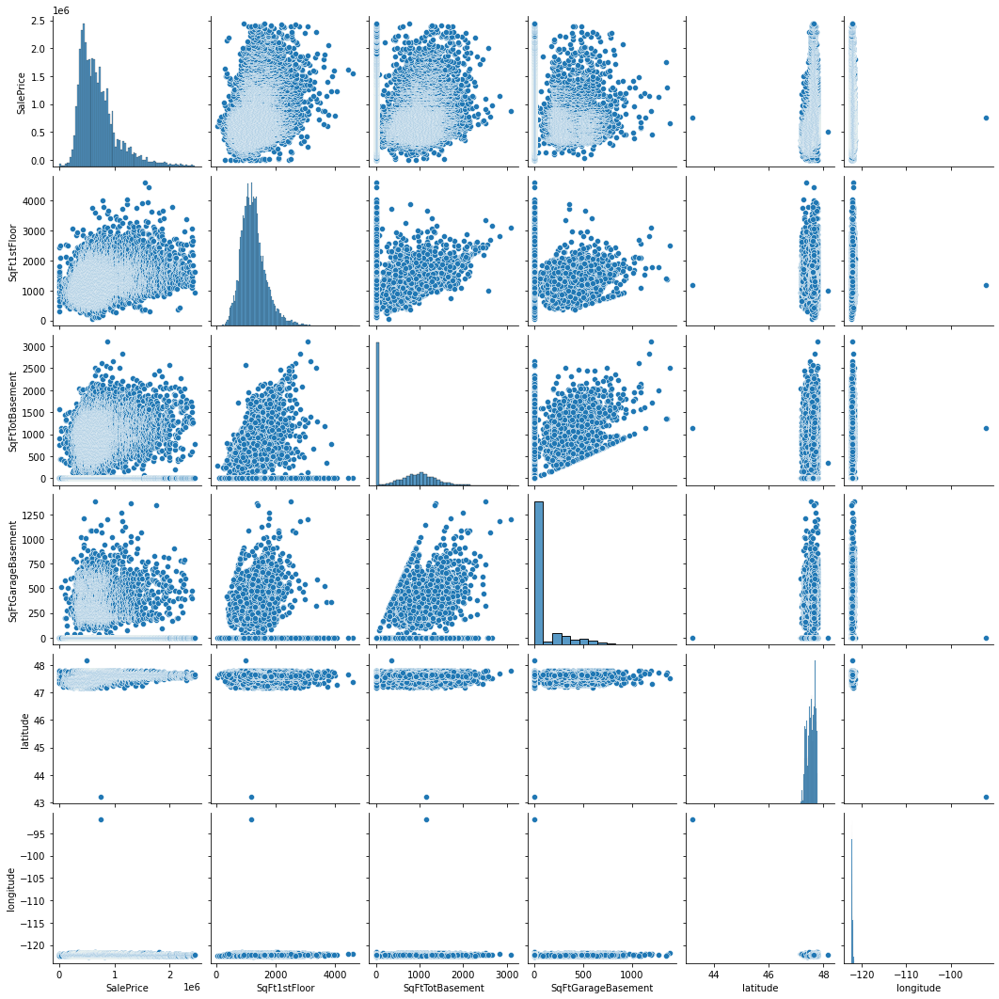

In [184]:
cont_pairplot = ['SalePrice','SqFt1stFloor','SqFtTotBasement','SqFtGarageBasement', 'latitude', 'longitude']

sns.pairplot(df3[cont_pairplot]);

These plots not very useful in their current state, however they have highlighted the need to remove further outliers..

In [185]:
df3 = drop_outliers(df3, 'latitude', 3)
df3 = drop_outliers(df3, 'longitude', 3)

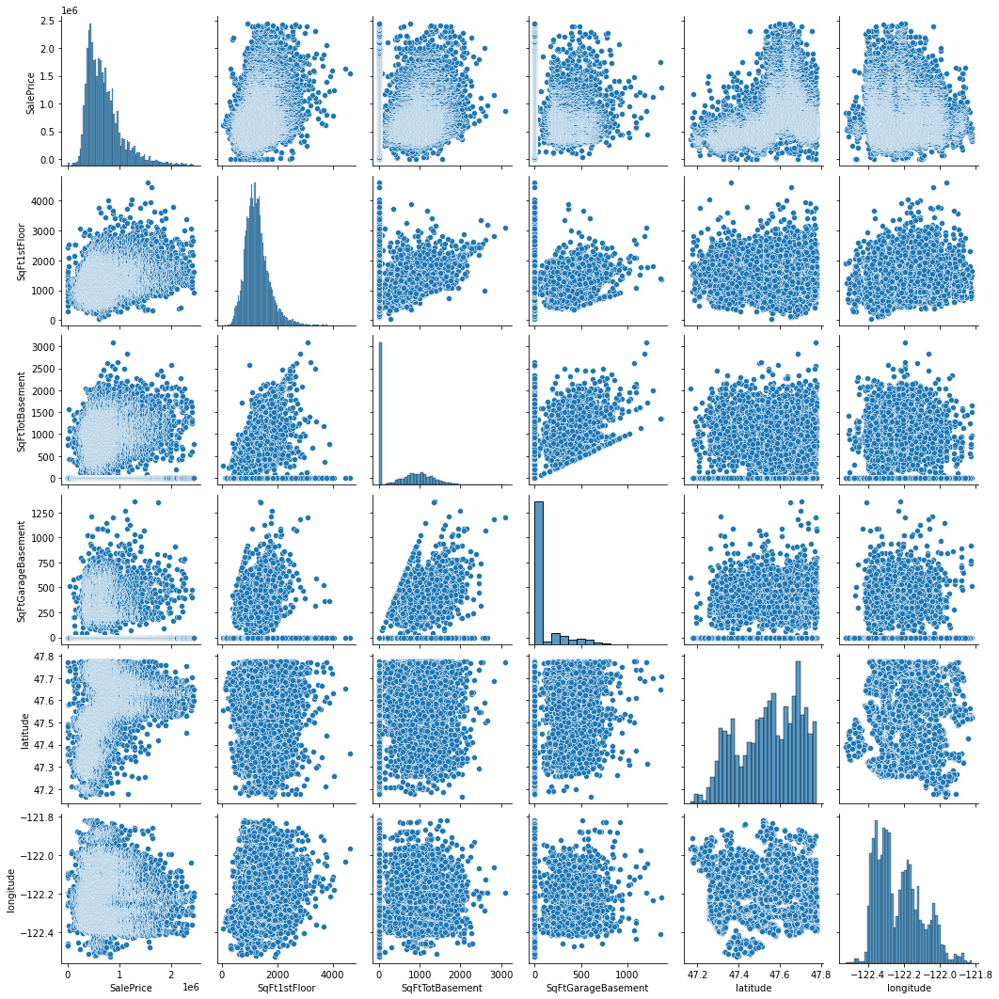

In [186]:
sns.pairplot(df3[cont_pairplot])

Messy data which is difficult to spot useful correlations but I think there are some trends particularly with SqfT1stFloor and latitude/longitude. It may be better to change some of these features into binary columns due to the high number of zeroes in each. For example SqFtGarageBasement could become (has_garagebasement).Aside from that, looking at the histograms, none of the features are normally distributed and could probably benefit from log transformation. 

In [187]:
# drop outliers from 'SqFt1stFloor'
df3 = drop_outliers(df3, 'SqFt1stFloor', 3)

In [188]:
features_3 = ['SqFtTotLiving','SqFt1stFloor', 'latitude', 'longitude']
X_train3 = df3[features_3]
y_train3 = df3['SalePrice']
X_int3 = sm.add_constant(X_train3)
model3 = sm.OLS(y_train3, X_int3).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.535
Model:                            OLS   Adj. R-squared:                  0.535
Method:                 Least Squares   F-statistic:                     4327.
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:54:35   Log-Likelihood:            -2.0765e+05
No. Observations:               15030   AIC:                         4.153e+05
Df Residuals:                   15025   BIC:                         4.154e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -7.291e+07   2.05e+06    -35.589      0.000   -7.69e+07   -6.89e+07
SqFtTotLiving   275.8215      3.236     85.238      0.000     269.479     282.164
SqFt1stFloor    -27.4989      6.371     -4.316      0.000     -39.988     -15.010
latitude       1.007e+06   1.37e+04     73.621      0.000     9.8e+05    1.03e+06
longitude     -2.064e+05   1.66e+04    -12.414      0.000   -2.39e+05   -1.74e+05
==============================================================================
Omnibus:                     4182.863   Durbin-Watson:                   0.842
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18348.360
Skew:                           1.302   Prob(JB):                         0.00
Kurtosis:                       7.746   Cond. No.                     2.56e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.56e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


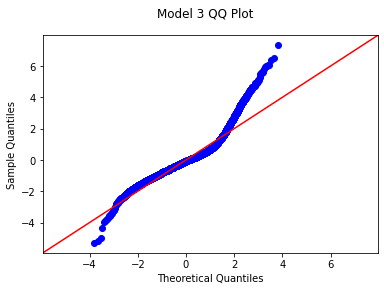

In [189]:
get_qq(model3, 'Model 3')

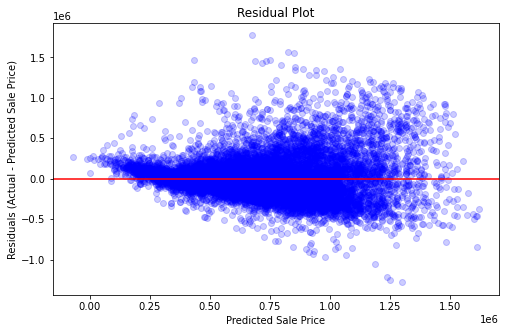

In [190]:
get_resid(df3, model3)

In [191]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg3 = linreg.fit(X_train3, y_train3)

scores3 = cross_val_score(
            linreg3, 
            X_train3,
            y_train3,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores3 = np.sqrt(-scores3)
display(rmse_scores3)
display(rmse_scores3.mean())
display(rmse_scores3.std())

array([201621.90629106, 140021.17393374, 163362.731922  , 189984.793088  ,
       202981.05367913, 195349.80303403, 183373.5191414 , 181095.90337485,
       217366.9863357 , 711475.09932703])

238663.29701269456

158954.98852596313

In [192]:
summary.loc[2] = ['Multiple Linear Model 1', 'Continuous features', model3.df_model, round(model3.rsquared,3)\
                  , round(model3.rsquared_adj,3), int(rmse_scores3.mean()), int(rmse_scores3.std()),\
                  round((sms.jarque_bera(model3.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0


# Model 4 (Distance to Expensive Areas and Age Features Added)

1. Most expensive house in mercer island is in 5330 Butterworth Rd, Mercer Island, Washington
2. Most expensive house in medina is in medina 7887 Overlake Drive West
3. NE Laurelcrest Lane has the most expensive house in Seattle. 
4. Another populous area is Kent. 148th Ave SE is the most expensive neighbourhood in Kent and quite populous, I will add these four locations using Geocode

In [193]:
from geopy.geocoders import Nominatim
expensive = ['5330 Butterworth Rd, Mercer Island, Washington', '7887 Overlake Drive West, Medina, WA',\
            'NE Laurelcrest Lane, Seattle, WA', '148th Ave SE, Kent, WA']
locator = Nominatim(user_agent='myGeocoder')
for loc in expensive:
    location = locator.geocode(loc)
    print(loc)
    print('Latitude = {}, Longitude = {}'.format(location.latitude, location.longitude))

5330 Butterworth Rd, Mercer Island, Washington
Latitude = 47.55621241561222, Longitude = -122.2129871659772
7887 Overlake Drive West, Medina, WA
Latitude = 47.6160689485921, Longitude = -122.23362543624816
NE Laurelcrest Lane, Seattle, WA
Latitude = 47.6560723, Longitude = -122.2725167
148th Ave SE, Kent, WA
Latitude = 47.3844953, Longitude = -122.1426915


In [194]:
laurelcrest = [47.6560723, -122.2725167]
medina = [47.6160689485921,-122.23362543624816] 
mercer = [47.55621241561222, -122.2129871659772]
kent = [47.3844953, -122.1426915]

In [195]:
df4 = df3.copy()

In [196]:
# create column in df4 with tuple containing lat long info
df4['lat_long'] = tuple(zip(df4.latitude, df4.longitude))
# calculate distance to each of the four expensive areas highlighted and create a column for it
df4['laurelcrest'] = calc_distances(df4['lat_long'], laurelcrest, df4)
df4['medina'] = calc_distances(df4['lat_long'], medina, df4)
df4['mercer'] = calc_distances(df4['lat_long'], mercer, df4)
df4['kent'] = calc_distances(df4['lat_long'], kent, df4)

# new column with the minimum value across these four columns
df4['dist_to_exp'] = df4[['laurelcrest', 'medina', 'mercer', 'kent']].min(axis=1, numeric_only=True)

#drop the rest original 4 and work with minimum distance to an expensive area
df4.drop(['laurelcrest', 'medina', 'mercer', 'kent'], axis=1, inplace=True)

C:\Users\Andrew\anaconda3\envs\geo-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


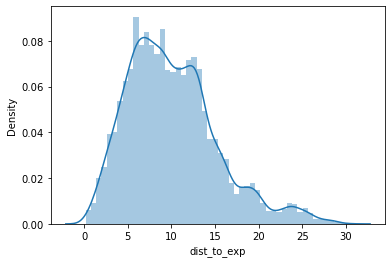

In [197]:
sns.distplot(df4.dist_to_exp);

C:\Users\Andrew\anaconda3\envs\geo-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='age', ylabel='Density'>

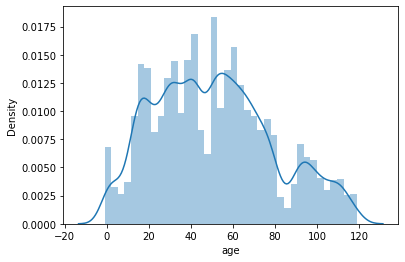

In [198]:
# create a new column for age feature
df4['age'] = 2019 - df4['YrBuilt']
sns.distplot(df4.age)

In [199]:
features_4 = ['SqFtTotLiving','SqFt1stFloor', 'latitude', 'longitude', 'dist_to_exp', 'age']
X_train4 = df4[features_4]
y_train4 = df4['SalePrice']
X_int4 = sm.add_constant(X_train4)
model4 = sm.OLS(y_train4, X_int4).fit()
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     3274.
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:54:47   Log-Likelihood:            -2.0713e+05
No. Observations:               15030   AIC:                         4.143e+05
Df Residuals:                   15023   BIC:                         4.143e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -4.927e+07   2.18e+06    -22.633      0.000   -5.35e+07    -4.5e+07
SqFtTotLiving   288.1086      3.320     86.790      0.000     281.602     294.615
SqFt1stFloor    -31.7000      6.287     -5.042      0.000     -44.024     -19.376
latitude       9.297e+05   1.35e+04     69.111      0.000    9.03e+05    9.56e+05
longitude     -4.327e+04   1.73e+04     -2.498      0.013   -7.72e+04   -9309.938
dist_to_exp   -1.057e+04    382.960    -27.596      0.000   -1.13e+04   -9817.377
age            1149.7452     79.533     14.456      0.000     993.850    1305.640
==============================================================================
Omnibus:                     3693.396   Durbin-Watson:                   0.925
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16023.068
Skew:                           1.145   Prob(JB):                         0.00
Kurtosis:                       7.510   Cond. No.                     2.82e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.82e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [200]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg4 = linreg.fit(X_train4, y_train4)

scores4 = cross_val_score(
            linreg4, 
            X_train4,
            y_train4,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores4 = np.sqrt(-scores4)
display(rmse_scores4)
display(rmse_scores4.mean())
display(rmse_scores4.std())

array([215374.88198928, 152968.68682059, 173107.84178114, 194312.91145496,
       201461.19390044, 185550.77147204, 177070.46518006, 173715.50766365,
       201522.77926357, 694540.85168871])

236962.5891214435

153473.79543835213

In [201]:
summary.loc[3] = ['Multiple Linear Model 2', 'Continuous features + age/dist_to_exp', model4.df_model, round(model4.rsquared,3)\
                  , round(model4.rsquared_adj,3), int(rmse_scores4.mean()), int(rmse_scores4.std()),\
                  round((sms.jarque_bera(model4.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0


# Model 5 - Add Binary Features

The next model I will test is one with the binary columns added to see what impact this will have.

In [202]:
df5 = df4.copy()
df5.columns

Index(['Address', 'BuildingNumber', 'DirectionPrefix', 'StreetName',
       'StreetType', 'DirectionSuffix', 'ZipCode', 'Stories', 'BldgGrade',
       'SqFt1stFloor', 'SqFtHalfFloor', 'SqFt2ndFloor', 'SqFtUpperFloor',
       'SqFtTotLiving', 'SqFtTotBasement', 'SqFtFinBasement',
       'FinBasementGrade', 'SqFtGarageBasement', 'SqFtGarageAttached',
       'DaylightBasement', 'SqFtOpenPorch', 'SqFtEnclosedPorch', 'SqFtDeck',
       'HeatSystem', 'HeatSource', 'BrickStone', 'ViewUtilization', 'Bedrooms',
       'BathHalfCount', 'Bath3qtrCount', 'BathFullCount', 'YrBuilt',
       'YrRenovated', 'Condition', 'id', 'Township', 'Section',
       'QuarterSection', 'Area', 'DistrictName', 'SqFtLot', 'Access',
       'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView', 'WfntLocation',
       'TrafficNoise', 'PowerLines', 'OtherNuisances', 'Adjace

In [203]:
# engineer column for traffic noise
df5.loc[df5['TrafficNoise']!= 0, 'TrafficNoise'] = 1

# engineer a column for has_basement
df5['has_basement'] = 0
df5.loc[(df5['SqFtGarageBasement']!= 0)|(df5['SqFtTotBasement']!= 0)|\
        (df5['DaylightBasement']!= 0), 'has_basement'] = 1

# engineer a column for has_deck
df5['has_deck'] = 0
df5.loc[(df5['SqFtDeck']!= 0),'has_deck'] = 1

# engineer a column for has_porch
df5['has_porch'] = 0
df5.loc[(df5['SqFtOpenPorch']!= 0)|(df5['SqFtEnclosedPorch']!= 0), 'has_porch'] = 1

# engineer a column for has_renovation
df5['has_renovation'] = 0
df5.loc[df5['YrRenovated'] != 0, 'has_renovation'] = 1

# engineer a column for has_problem
df5['has_problem'] = 0
df5.loc[(df5['PowerLines'] != 0)|(df5['OtherNuisances'] != 0), 'has_problem'] = 1


In [204]:
binary_cols5 = ['AdjacentGreenbelt','excellent_view','Topography', 'InadequateParking', 'MtRainier',\
               'Olympics', 'Cascades','Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington','LakeSammamish',\
               'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',
               'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem']

cont_5 = ['SqFtTotLiving','SqFt1stFloor', 'latitude', 'longitude', 'dist_to_exp', 'age']

In [205]:
features_5 = binary_cols5 + cont_5
X_train5 = df5[features_5]
y_train5 = df5['SalePrice']
X_int5 = sm.add_constant(X_train5)
model5 = sm.OLS(y_train5, X_int5).fit()
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     852.7
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:54:52   Log-Likelihood:            -2.0609e+05
No. Observations:               15030   AIC:                         4.122e+05
Df Residuals:                   15000   BIC:                         4.125e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -4.473e+07   2.19e+06    -20.387      0.000    -4.9e+07   -4.04e+07
AdjacentGreenbelt    1.538e+04   1.18e+04      1.308      0.191   -7662.162    3.84e+04
excellent_view        1.13e+05   1.93e+04      5.853      0.000    7.52e+04    1.51e+05
Topography           1.856e+04   6930.618      2.677      0.007    4971.100    3.21e+04
InadequateParking    3.499e+04   3690.286      9.482      0.000    2.78e+04    4.22e+04
MtRainier            7.174e+04   2.15e+04      3.342      0.001    2.97e+04    1.14e+05
Olympics             7.625e+04    1.6e+04      4.775      0.000    4.49e+04    1.08e+05
Cascades            -6411.7770   1.32e+04     -0.485      0.627   -3.23e+04    1.95e+04
Territorial          5629.9652   9303.120      0.605      0.545   -1.26e+04    2.39e+04
SeattleSkyline       1.806e+05   2.13e+04      8.482      0.000    1.39e+05    2.22e+05
PugetSound           9.376e+04   1.44e+04      6.503      0.000    6.55e+04    1.22e+05
LakeWashington       1.588e+05    1.4e+04     11.338      0.000    1.31e+05    1.86e+05
LakeSammamish        3.203e+05   2.85e+04     11.239      0.000    2.64e+05    3.76e+05
SmallLakeRiverCreek -3.239e+04   2.64e+04     -1.229      0.219   -8.41e+04    1.93e+04
OtherView             1.02e+05   3.15e+04      3.234      0.001    4.02e+04    1.64e+05
WfntLocation         2.695e+05   2.38e+04     11.321      0.000    2.23e+05    3.16e+05
Easements            2.628e+04   1.32e+04      1.985      0.047     335.462    5.22e+04
SaleWarning         -1.038e+05   7446.043    -13.945      0.000   -1.18e+05   -8.92e+04
ViewUtilization      1.977e+05   1.39e+04     14.211      0.000     1.7e+05    2.25e+05
has_porch            4.345e+04   3772.634     11.516      0.000    3.61e+04    5.08e+04
has_renovation       5.696e+04   8279.590      6.880      0.000    4.07e+04    7.32e+04
has_basement        -1.747e+04   4306.812     -4.057      0.000   -2.59e+04   -9030.786
TrafficNoise        -3.003e+04   5205.521     -5.769      0.000   -4.02e+04   -1.98e+04
has_problem         -2.974e+04   9259.612     -3.211      0.001   -4.79e+04   -1.16e+04
SqFtTotLiving         251.4487      3.557     70.700      0.000     244.477     258.420
SqFt1stFloor          -16.5864      6.160     -2.693      0.007     -28.661      -4.512
latitude             9.458e+05   1.28e+04     73.632      0.000    9.21e+05    9.71e+05
longitude            -103.5302   1.75e+04     -0.006      0.995   -3.43e+04    3.41e+04
dist_to_exp         -1.147e+04    371.311    -30.882      0.000   -1.22e+04   -1.07e+04
age                   922.0280     81.847     11.265      0.000     761.598    1082.458
==============================================================================
Omnibus:                     3390.296   Durbin-Watson:                   1.049
Prob(Omnibus):       

In [206]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg5 = linreg.fit(X_train5, y_train5)

scores5 = cross_val_score(
            linreg5, 
            X_train5,
            y_train5,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores5 = np.sqrt(-scores5)
display(rmse_scores5)
display(rmse_scores5.mean())
display(rmse_scores5.std())

array([209955.6801617 , 142784.92231253, 162558.27142548, 181399.6617275 ,
       188908.94376808, 176733.07227389, 170209.56608749, 171807.44077743,
       205131.39188023, 663269.84225369])

227275.879266802

146517.14238741784

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


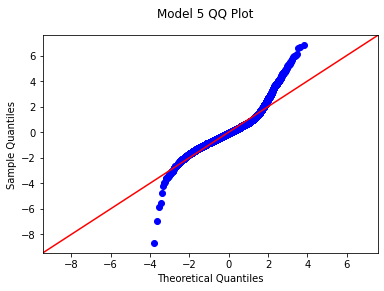

In [207]:
get_qq(model5, 'Model 5')

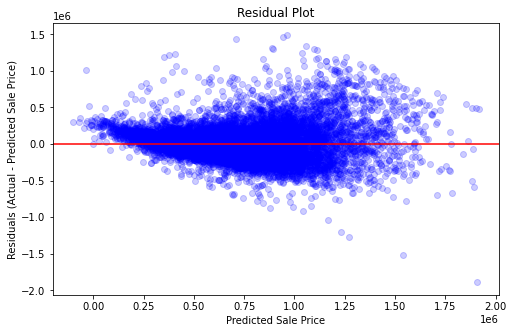

In [208]:
get_resid(df5, model5)

In [209]:
summary.loc[4] = ['Multiple Linear Model 3', 'continuous + binary features', model5.df_model, round(model5.rsquared,3)\
                  , round(model5.rsquared_adj,3), int(rmse_scores5.mean()), int(rmse_scores5.std()),\
                  round((sms.jarque_bera(model5.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.0,146517.0,16416.0


# Model 6 - Adding Categorical Features

ok now it is time to add further categorical features, however, we will need to onehotencode them first. 

In [210]:
df5.columns

Index(['Address', 'BuildingNumber', 'DirectionPrefix', 'StreetName',
       'StreetType', 'DirectionSuffix', 'ZipCode', 'Stories', 'BldgGrade',
       'SqFt1stFloor', 'SqFtHalfFloor', 'SqFt2ndFloor', 'SqFtUpperFloor',
       'SqFtTotLiving', 'SqFtTotBasement', 'SqFtFinBasement',
       'FinBasementGrade', 'SqFtGarageBasement', 'SqFtGarageAttached',
       'DaylightBasement', 'SqFtOpenPorch', 'SqFtEnclosedPorch', 'SqFtDeck',
       'HeatSystem', 'HeatSource', 'BrickStone', 'ViewUtilization', 'Bedrooms',
       'BathHalfCount', 'Bath3qtrCount', 'BathFullCount', 'YrBuilt',
       'YrRenovated', 'Condition', 'id', 'Township', 'Section',
       'QuarterSection', 'Area', 'DistrictName', 'SqFtLot', 'Access',
       'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView', 'WfntLocation',
       'TrafficNoise', 'PowerLines', 'OtherNuisances', 'Adjace

In [211]:
features_6 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude', 'longitude',\
               'dist_to_exp', 'age', 'SalePrice']

Prior to adding in ZipCodes into the analysis, I will have a quick QC of the values. I don't think including zips with few entries will be valuable

In [212]:
df6 = df5.copy()
df6.ZipCode.value_counts()

98042         521
98023         499
98058         443
98115         414
98038         403
98034         392
98117         383
98001         342
98118         337
98103         335
98052         331
98133         322
98155         304
98059         296
98006         294
98033         275
98056         273
98003         273
98106         272
98092         270
98031         268
98126         266
98074         265
98125         263
98168         253
98116         237
98178         231
98198         226
98146         219
98199         217
98177         212
98002         211
98022         207
98008         207
98028         202
98030         197
98122         196
98053         195
98144         194
98027         192
98055         183
98075         182
98105         181
98040         180
98136         178
98112         177
98166         171
98072         170
98107         157
98029         155
98108         151
98011         150
98077         132
98032         124
98119         121
98004     

In [213]:
zips_to_keep = ['98042', '98023', '98058', '98117', '98115', '98034', '98038', '98133',
       '98001', '98118', '98103', '98155', '98052', '98003', '98031', '98059',
       '98125', '98056', '98168', '98106', '98126', '98092', '98146', '98198',
       '98006', '98178', '98116', '98002', '98033', '98030', '98074', '98022',
       '98177', '98008', '98028', '98055', '98122', '98144', '98199', '98136',
       '98045', '98107', '98072', '98108', '98166', '98011', '98029', '98027',
       '98053', '98105', '98188', '98112', '98032', '98065', '98075', '98119',
       '98019', '98077', '98007', '98070', '98014', '98040', '98148', '98005',
       '98109', '98004', '98102', '98024', '98010', '98047', '98051']

In [214]:
df6 = df6[df6['ZipCode'].isin(zips_to_keep)]

In [215]:
categoricals6 = ['HeatSystem', 'HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

cat6_ohe = df6[categoricals6]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder.fit(cat6_ohe)
cat6_ohe = encoder.transform(cat6_ohe)
cat6_ohe = pd.DataFrame(cat6_ohe, columns = encoder.get_feature_names())
cont6 = df6[features_6]
cat6_ohe.reset_index(drop=True, inplace=True)
cont6.reset_index(drop=True, inplace=True)
preprocessed6 = pd.concat([cont6, cat6_ohe], axis=1)
X_train6 = preprocessed6.drop('SalePrice', axis=1)
y_train6 = preprocessed6['SalePrice']

In [216]:
X_int6 = sm.add_constant(X_train6)
model6 = sm.OLS(y_train6, X_int6).fit()
model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     474.0
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:55:00   Log-Likelihood:            -1.9993e+05
No. Observations:               14980   AIC:                         4.001e+05
Df Residuals:                   14840   BIC:                         4.012e+05
Df Model:                         139                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -9.809e+05   8.22e+06     -0.119      0.905   -1.71e+07    1.51e+07
AdjacentGreenbelt    -2184.8460   8457.549     -0.258      0.796   -1.88e+04    1.44e+04
excellent_view        1.383e+05   1.36e+04     10.140      0.000    1.12e+05    1.65e+05
Topography           -1.224e+04   4986.125     -2.455      0.014    -2.2e+04   -2469.078
InadequateParking    -8996.6520   3240.568     -2.776      0.006   -1.53e+04   -2644.737
MtRainier            -1.718e+04   1.53e+04     -1.125      0.260   -4.71e+04    1.27e+04
Olympics              5.293e+04   1.14e+04      4.625      0.000    3.05e+04    7.54e+04
Cascades              8032.4087   9406.227      0.854      0.393   -1.04e+04    2.65e+04
Territorial          -2587.3475   6586.966     -0.393      0.694   -1.55e+04    1.03e+04
SeattleSkyline        9.377e+04   1.52e+04      6.171      0.000     6.4e+04    1.24e+05
PugetSound            7.019e+04   1.04e+04      6.769      0.000    4.99e+04    9.05e+04
LakeWashington         1.65e+05   1.01e+04     16.292      0.000    1.45e+05    1.85e+05
LakeSammamish         1.684e+05    2.1e+04      8.018      0.000    1.27e+05     2.1e+05
SmallLakeRiverCreek  -3.776e+04   1.87e+04     -2.015      0.044   -7.45e+04   -1031.098
OtherView            -4.678e+04   2.26e+04     -2.071      0.038   -9.11e+04   -2509.884
WfntLocation          2.624e+05   1.71e+04     15.316      0.000    2.29e+05    2.96e+05
Easements             2.551e+04   9495.370      2.687      0.007    6899.282    4.41e+04
SaleWarning          -1.068e+05   5316.260    -20.086      0.000   -1.17e+05   -9.64e+04
ViewUtilization        7.53e+04      1e+04      7.496      0.000    5.56e+04     9.5e+04
has_porch             2.133e+04   2690.030      7.931      0.000    1.61e+04    2.66e+04
has_renovation            7e+04   6037.834     11.594      0.000    5.82e+04    8.18e+04
has_basement          -1.51e+04   3161.615     -4.775      0.000   -2.13e+04   -8899.337
TrafficNoise         -3.291e+04   3682.486     -8.936      0.000   -4.01e+04   -2.57e+04
has_problem          -2.255e+04   6591.810     -3.421      0.001   -3.55e+04   -9627.776
SqFtTotLiving          156.0752      3.408     45.792      0.000     149.394     162.756
SqFt1stFloor            14.1965      4.744      2.992      0.003       4.897      23.496
latitude               1.31e+05   6.79e+04      1.929      0.054   -2106.945    2.64e+05
longitude             3.687e+04   6.43e+04      0.574      0.566   -8.91e+04    1.63e+05
dist_to_exp          -9278.2377    852.469    -10.884      0.000   -1.09e+04   -7607.293
age                    281.0426     72.975      3.851      0.000     138.003     424.082
x0_Floor-Wall        -1886.9287   9002.708     -0.210      0.834   -1.95e+04    1.58e+04
x0_Forced Air         2737.4482   6495.512      0.421    

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


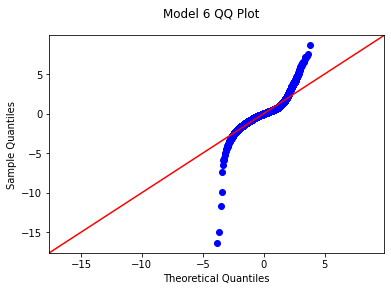

In [217]:
get_qq(model6, 'Model 6')

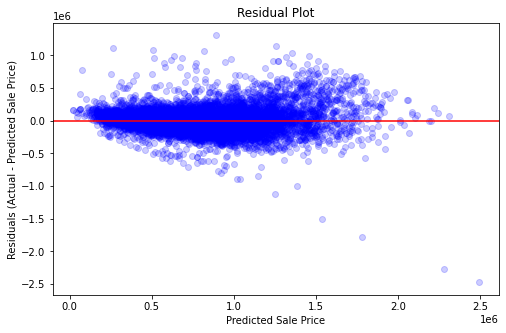

In [218]:
get_resid(preprocessed6, model6)

In [219]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg6 = linreg.fit(X_train6, y_train6)

scores6 = cross_val_score(
            linreg6, 
            X_train6,
            y_train6,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores6 = np.sqrt(-scores6)
display(rmse_scores6)
display(rmse_scores6.mean())
display(rmse_scores6.std())

array([187165.76612223,  95201.47920293,  92223.77021711, 105275.92555318,
       125961.47105437, 122146.37209557, 128926.18138758, 141953.59817183,
       158452.64936749, 512208.35599718])

166951.55691694707

118312.22299791012

In [220]:
summary.loc[5] = ['Multiple Linear Model 4', 'continuous + binary features + cat', model6.df_model, round(model6.rsquared,3)\
                  , round(model6.rsquared_adj,3), int(rmse_scores6.mean()), int(rmse_scores6.std()),\
                  round((sms.jarque_bera(model6.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.0,146517.0,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.0,118312.0,165256.0


The JB metric on this model has increased by an order of magnitude and its clear from the qq plot that the normality of residuals assumption is not being met, there could also be strong multicollinearity at play. I will work to try and improve this model both in terms of R^2 but more importantly the JB number to provide confidence in the results. 

In [221]:
# check for highly correlated features
get_multicol(preprocessed6)

,cc
pairs,
"(x2_PUBLIC, x2_PRIVATE)",0.985493
"(x4_4, x4_3)",0.748812


Ok so two dummy variables are highly correlated, this would lead me to suspect the variable being dropped when onehotencoding has a relatively low count. It may be worse removing these rows from the analysis for the next model. 

In [222]:
get_multicol(df6)

,cc
pairs,
"(age, YrBuilt)",1.000000
"(has_renovation, YrRenovated)",0.999959
"(latitude, Township)",0.984267
"(has_basement, SqFtTotBasement)",0.882418
"(OtherNuisances, has_problem)",0.846419
"(FinBasementGrade, SqFtFinBasement)",0.845789
"(SqFtFinBasement, SqFtTotBasement)",0.837436
"(Stories, SqFt2ndFloor)",0.824724
"(has_basement, FinBasementGrade)",0.822696


# Model 7 - Cleaning features, adding SqFt2ndFloor

In [223]:
df7 = df6.copy()

In [224]:
df7.Condition.value_counts()

3    8487
4    4497
5    1862
2     119
1      15
Name: Condition, dtype: int64

In [225]:
df7.Access.value_counts()

PUBLIC               14096
PRIVATE                860
WALK IN                 11
RESTRICTED              11
LEGAL/UNDEVELOPED        2
Name: Access, dtype: int64

I will drop rows containing 1 and 2 in 'Condition' and keep only PUBLIC and PRIVATE in Access to try and reduce multicollinearity

In [226]:
df7 = df7[(df7['Condition']==3)|(df7['Condition']==4)|(df7['Condition']==5)]
df7 = df7[(df7['Access']=='PUBLIC')|(df7['Access']=='PRIVATE')]

In [227]:
df7.Condition.value_counts()

3    8475
4    4489
5    1858
Name: Condition, dtype: int64

In [228]:
df7.Access.value_counts()

PUBLIC     13970
PRIVATE      852
Name: Access, dtype: int64

In [229]:
# check other categorical features for such imbalances
df7.Bedrooms.value_counts()

3     6784
4     4834
2     1801
5     1091
6      142
1      137
0       14
7       13
8        4
9        1
10       1
Name: Bedrooms, dtype: int64

In [230]:
# remove high and low values
df7 = df7[(df7['Bedrooms']>1)&(df7['Bedrooms']<7)]

In [231]:
df7.Bedrooms.value_counts()

3    6784
4    4834
2    1801
5    1091
6     142
Name: Bedrooms, dtype: int64

In [232]:
df7.HeatSource.value_counts()

Gas                  10348
Electricity           2578
Oil                   1676
Gas/Solar               30
Other                    9
Electricity/Solar        8
Oil/Solar                3
Name: HeatSource, dtype: int64

In [233]:
# remove low number entries
df7 = df7[(df7['HeatSource']=='Gas')|(df7['HeatSource']=='Electricity')|(df7['HeatSource']=='Oil')]

In [234]:
df7.HeatSource.value_counts()

Gas            10348
Electricity     2578
Oil             1676
Name: HeatSource, dtype: int64

In [235]:
# add SqFt2ndFloor
features_7 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude', 'longitude',\
               'dist_to_exp', 'age', 'SalePrice', 'SqFt2ndFloor']
categoricals7 = ['HeatSystem', 'HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [236]:
cat7_ohe = df7[categoricals7]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder7 = encoder.fit(cat7_ohe)
cat7_ohe = encoder7.transform(cat7_ohe)
cat7_ohe = pd.DataFrame(cat7_ohe, columns = encoder7.get_feature_names())
cont7 = df7[features_7]
cat7_ohe.reset_index(drop=True, inplace=True)
cont7.reset_index(drop=True, inplace=True)
preprocessed7 = pd.concat([cont7, cat7_ohe], axis=1)
X_train7 = preprocessed7.drop('SalePrice', axis=1)
y_train7 = preprocessed7['SalePrice']

In [237]:
X_int7 = sm.add_constant(X_train7)
model7 = sm.OLS(y_train7, X_int7).fit()
model7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     547.0
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:55:18   Log-Likelihood:            -1.9462e+05
No. Observations:               14602   AIC:                         3.895e+05
Df Residuals:                   14478   BIC:                         3.904e+05
Df Model:                         123                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -4.362e+05   8.21e+06     -0.053      0.958   -1.65e+07    1.57e+07
AdjacentGreenbelt   -4369.1973   8335.863     -0.524      0.600   -2.07e+04     1.2e+04
excellent_view       1.517e+05   1.38e+04     10.979      0.000    1.25e+05    1.79e+05
Topography          -1.149e+04   4996.727     -2.300      0.021   -2.13e+04   -1698.574
InadequateParking   -9172.6588   3221.223     -2.848      0.004   -1.55e+04   -2858.650
MtRainier           -1.132e+04   1.52e+04     -0.742      0.458   -4.12e+04    1.86e+04
Olympics             5.474e+04   1.14e+04      4.787      0.000    3.23e+04    7.72e+04
Cascades             2947.6465   9365.017      0.315      0.753   -1.54e+04    2.13e+04
Territorial         -2506.7665   6563.092     -0.382      0.703   -1.54e+04    1.04e+04
SeattleSkyline       9.543e+04    1.5e+04      6.382      0.000    6.61e+04    1.25e+05
PugetSound           6.968e+04   1.03e+04      6.738      0.000    4.94e+04       9e+04
LakeWashington       1.723e+05   1.01e+04     17.063      0.000    1.53e+05    1.92e+05
LakeSammamish         1.74e+05   2.07e+04      8.421      0.000    1.33e+05    2.14e+05
SmallLakeRiverCreek -3.179e+04   1.92e+04     -1.660      0.097   -6.93e+04    5753.859
OtherView           -6.663e+04   2.26e+04     -2.945      0.003   -1.11e+05   -2.23e+04
WfntLocation         2.653e+05   1.75e+04     15.122      0.000    2.31e+05       3e+05
Easements            2.339e+04   9470.408      2.470      0.014    4825.640     4.2e+04
SaleWarning         -1.115e+05   5369.529    -20.774      0.000   -1.22e+05   -1.01e+05
ViewUtilization      7.205e+04   9961.204      7.233      0.000    5.25e+04    9.16e+04
has_porch            1.847e+04   2694.022      6.857      0.000    1.32e+04    2.38e+04
has_renovation        6.61e+04   6030.647     10.960      0.000    5.43e+04    7.79e+04
has_basement         2378.1533   3893.550      0.611      0.541   -5253.702       1e+04
TrafficNoise        -3.168e+04   3672.715     -8.626      0.000   -3.89e+04   -2.45e+04
has_problem         -2.215e+04   6639.626     -3.336      0.001   -3.52e+04   -9134.841
SqFtTotLiving         134.6169      4.423     30.435      0.000     125.947     143.287
SqFt1stFloor           43.6443      5.999      7.275      0.000      31.885      55.404
latitude             1.345e+05   6.76e+04      1.988      0.047    1892.531    2.67e+05
longitude            4.746e+04   6.42e+04      0.740      0.459   -7.83e+04    1.73e+05
dist_to_exp         -9339.6238    847.119    -11.025      0.000    -1.1e+04   -7679.161
age                   466.1618     73.888      6.309      0.000     321.333     610.991
SqFt2ndFloor           38.6101      4.793      8.056      0.000      29.216      48.004
x0_Floor-Wall       -6714.2314   9198.508     -0.730      0.465   -2.47e+04    1.13e+04
x0_

In [238]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg7 = linreg.fit(X_train7, y_train7)

scores7 = cross_val_score(
            linreg7, 
            X_train7,
            y_train7,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores7 = np.sqrt(-scores7)
display(rmse_scores7)
display(rmse_scores7.mean())
display(rmse_scores7.std())

array([185478.31155742,  92977.26615748,  90360.84457932, 104889.50489757,
       123299.89058647, 120816.71510651, 126734.21751375, 139383.6105672 ,
       153720.09360283, 511661.9363623 ])

164932.23909308625

118703.0456134486

In [239]:
summary.loc[6] = ['Multiple Linear Model 5', 'MLP 4 + SqFt2nd + Clean Cat', model7.df_model, round(model7.rsquared,3)\
                  , round(model7.rsquared_adj,3), int(rmse_scores7.mean()), int(rmse_scores7.std()),\
                  round((sms.jarque_bera(model7.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.0,146517.0,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.0,118312.0,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.0,118703.0,206712.0


By reducing the number of features, we actually managed to improve the R-squared, which is perhaps and indication that the features that were dropped were causing problems. However, the JB number is still high. Another pass of outliers may be required.

Longitude has been a persistent bad actor, again this is worth investigating further

In [240]:
df7.HeatSystem.value_counts()

Forced Air    11710
Elec BB         986
Heat Pump       974
Floor-Wall      420
Hot Water       320
Radiant         152
Gravity          36
Other             4
Name: HeatSystem, dtype: int64

It was noted that the majority of the dummy variables pertaining to the Heat System column had high P-values. It might be worth making this a binary column, either forced air or not. I will create a new column for this rather than lose the data here. 

In [241]:
df7.SalePrice.describe()

count    1.460200e+04
mean     7.077948e+05
std      3.533408e+05
min      1.000000e+01
25%      4.500000e+05
50%      6.300000e+05
75%      8.520000e+05
max      2.450000e+06
Name: SalePrice, dtype: float64

A very large spread on this, but interestingly some low values that I am keen to investigate more. 

In [242]:
df7[df7['SalePrice']< 100000].sort_values('SalePrice')

,Address,BuildingNumber,DirectionPrefix,StreetName,StreetType,DirectionSuffix,ZipCode,Stories,BldgGrade,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtTotLiving,SqFtTotBasement,SqFtFinBasement,FinBasementGrade,SqFtGarageBasement,SqFtGarageAttached,DaylightBasement,SqFtOpenPorch,SqFtEnclosedPorch,SqFtDeck,HeatSystem,HeatSource,BrickStone,ViewUtilization,Bedrooms,BathHalfCount,Bath3qtrCount,BathFullCount,YrBuilt,YrRenovated,Condition,id,Township,Section,QuarterSection,Area,DistrictName,SqFtLot,Access,Topography,InadequateParking,MtRainier,Olympics,Cascades,Territorial,SeattleSkyline,PugetSound,LakeWashington,LakeSammamish,SmallLakeRiverCreek,OtherView,WfntLocation,TrafficNoise,PowerLines,OtherNuisances,AdjacentGreenbelt,Easements,DocumentDate,SalePrice,SaleWarning,address,excellent_view,latitude,longitude,lat_long,dist_to_exp,age,has_basement,has_deck,has_porch,has_renovation,has_problem
0,17701 185TH AVE NE 98072,17701,,185TH,AVE,NE,98072,1.0,7,750,0,0,0,1500,750,750,7,0,0,1,0,0,520,Forced Air,Electricity,0,0,3,1,0,1,1977,0,5,1630700286,26,7,NW,36,KING COUNTY,14494,PUBLIC,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,06/03/2019,10,0,"17701 185TH AVE NE, KING COUNTY, WA, USA",0,47.755786,-122.093057,"(47.75578577329484, -122.09305676064334)",17.414353,42,1,1,0,0,0
1,9508 167TH AVE NE 98052,9508,,167TH,AVE,NE,98052,1.0,7,1290,0,0,0,1290,0,0,0,0,300,0,0,260,0,Elec BB,Electricity,0,0,3,0,0,2,1967,0,4,6138400450,25,1,NW,72,REDMOND,9687,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,06/08/2019,1000,1,"9508 167TH AVE NE, REDMOND, WA, USA",0,47.685851,-122.116413,"(47.6858506, -122.1164129952656)",11.717289,52,0,0,1,0,0
2,19361 61ST AVE NE 98028,19361,,61ST,AVE,NE,98028,2.0,7,1470,0,490,0,1960,0,0,0,0,310,0,0,0,160,Forced Air,Gas,0,0,3,0,1,2,1958,0,4,226049046,26,2,SW,38,KENMORE,16183,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,08/01/2019,1500,1,"19361 61ST AVE NE, KENMORE, WA, USA",0,47.769338,-122.264630,"(47.7693383, -122.26462994152904)",12.608437,61,0,1,0,0,0
3,15915 VASHON HWY SW 98070,15915,,VASHON,HWY,SW,98070,1.0,7,1330,0,0,0,1330,0,0,0,0,0,0,0,40,180,Floor-Wall,Oil,0,0,3,0,0,1,1950,0,4,1923039062,23,19,SE,100,KING COUNTY,35283,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,05/02/2019,1500,1,"15915 VASHON HWY SW, KING COUNTY, WA, USA",0,47.461183,-122.460504,"(47.461183, -122.460504)",21.384113,69,0,1,1,0,0
5,19501 61ST AVE NE 98028,19501,,61ST,AVE,NE,98028,1.0,7,1190,0,0,0,1190,0,0,0,0,440,0,40,0,0,Elec BB,Electricity,0,0,3,0,0,1,1968,0,3,4027700795,26,2,NW,38,KENMORE,9000,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,04/29/2019,1600,1,"19501 61ST AVE NE, KENMORE, WA, USA",0,47.769912,-122.264554,"(47.769911750000006, -122.26455438421549)",12.672397,51,0,0,1,0,0
6,10649 SW CEDARHURST RD 98070,10649,SW,CEDARHURST,RD,,98070,2.0,8,900,0,740,0,1640,0,0,0,0,0,0,50,0,120,Forced Air,Gas,0,0,2,1,0,1,1986,0,3,1823039095,23,18,NE,100,KING COUNTY,217073,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,02/28/2019,2050,1,"10649 SW CEDARHURST RD , KING COUNTY, WA, USA",0,47.479549,-122.471536,"(47.4795489851883, -122.47153576405545)",21.205072,33,0,1,1,0,0
7,3237 110TH AVE SE 98004,3237,,110TH,AVE,SE,98004,3.0,9,2450,0,1180,330,3960,0,0,0,0,1060,0,50,0,180,Forced Air,Gas,0,0,4,0,3,1,1948,1999,3,2450000060,24,8,SE,92,BELLEVUE,12170,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,02/15/2019,2540,1,"3237 110TH AVE SE, BELLEVUE, WA, USA",0,47.581655,-122.194032,"(47.581655023423, -122.19403161819356)",3.166413,71,0,1,1,1,0
9,6837 S 124TH ST 98178,6837,S,124TH,ST,,98178,1.0,6,1130,0,0,0,1310,910,180,5,0,0,0,0,0,0,Forced Air,Oil,0,0,4,0,0,1,1953,0,3,7812801905,23,12,SW,25,KING COUNTY,9000,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,02/07/2019,3000,1,"6837 S 124TH ST , KING COUNTY, WA, USA",0,47.492302,-122.247527,"(47.49230205, -122.24752725413978)",7.564986,66,1,0,0,0,0
10,19632 62ND AVE NE 98028,19632,,62ND,AVE,NE,98028,1.0,7,1670,0,0,0,1670,0,0,0,0,400,0,0,0,0,Forced Air,Gas,0,0,4,0,1,2,1967,0,3,3824100106,26,2,NE,38,KENMORE,9547,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0

There are several properties in sought  after areas (Mercer Island, Bellevue) that have clearly had the wrong price entered.
I will remove these for the next model.

In [243]:
df7.describe()

,BuildingNumber,Stories,BldgGrade,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtTotLiving,SqFtTotBasement,SqFtFinBasement,FinBasementGrade,SqFtGarageBasement,SqFtGarageAttached,DaylightBasement,SqFtOpenPorch,SqFtEnclosedPorch,SqFtDeck,BrickStone,ViewUtilization,Bedrooms,BathHalfCount,Bath3qtrCount,BathFullCount,YrBuilt,YrRenovated,Condition,id,Township,Section,Area,SqFtLot,Topography,InadequateParking,MtRainier,Olympics,Cascades,Territorial,SeattleSkyline,PugetSound,LakeWashington,LakeSammamish,SmallLakeRiverCreek,OtherView,WfntLocation,TrafficNoise,PowerLines,OtherNuisances,AdjacentGreenbelt,Easements,SalePrice,SaleWarning,excellent_view,latitude,longitude,dist_to_exp,age,has_basement,has_deck,has_porch,has_renovation,has_problem
count,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,1.460200e+04,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,1.460200e+04,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000,14602.000000
mean,10789.922202,1.424702,7.517532,1246.618956,49.453910,388.716683,6.953773,1996.445487,495.817011,305.906931,2.878578,84.081153,249.184427,0.269689,56.400767,5.344405,135.469182,3.914464,0.018970,3.385358,0.436242,0.497466,1.485413,1968.367073,106.293179,3.555472,4.590879e+09,23.790097,18.216203,46.842556,14032.729147,0.076770,0.603410,0.007739,0.021846,0.027599,0.091905,0.008355,0.028969,0.022394,0.004451,0.006095,0.003356,0.008697,0.139091,0.011368,0.027257,0.025202,0.019107,7.077948e+05,0.058211,0.011711,47.542850,-122.227702,10.077327,50.632927,0.497124,0.485276,0.482400,0.053143,0.038077
std,9420.323006,0.501587,1.027597,389.750327,169.907707,570.707007,66.428104,761.526937,563.799068,434.161724,3.490060,176.767700,275.202454,0.443813,97.080682,32.887119,204.054262,17.728102,0.136424,0.830823,0.514374,0.623293,0.624226,27.967550,448.699243,0.705995,2.864283e+09,1.684433,10.319227,26.760537,32339.902218,0.266236,0.489206,0.087632,0.146187,0.163826,0.288902,0.091026,0.167724,0.147967,0.066573,0.077835,0.057833,0.092857,0.346053,0.106018,0.162836,0.156744,0.136906,3.533408e+05,0.234150,0.107584,0.147084,0.125058,5.151632,27.967550,0.500009,0.499800,0.499707,0.224327,0.191389
min,6.000000,1.000000,5.000000,50.000000,0.000000,0.000000,0.000000,402.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,3.000000,1.000067e+06,19.000000,1.000000,1.000000,375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+01,0.000000,0.000000,47.164714,-122.524667,0.160628,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2818.000000,1.000000,7.000000,980.000000,0.000000,0.000000,0.000000,1420.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,1.000000,1950.000000,0.000000,3.000000,2.139325e+09,22.000000,9.000000,25.000000,5400.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.500000e+05,0.000000,0.000000,47.424913,-122.331478,6.233818,29.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8410.000000,1.000000,7.000000,1210.000000,0.000000,0.000000,0.000000,1890.000000,0.0000

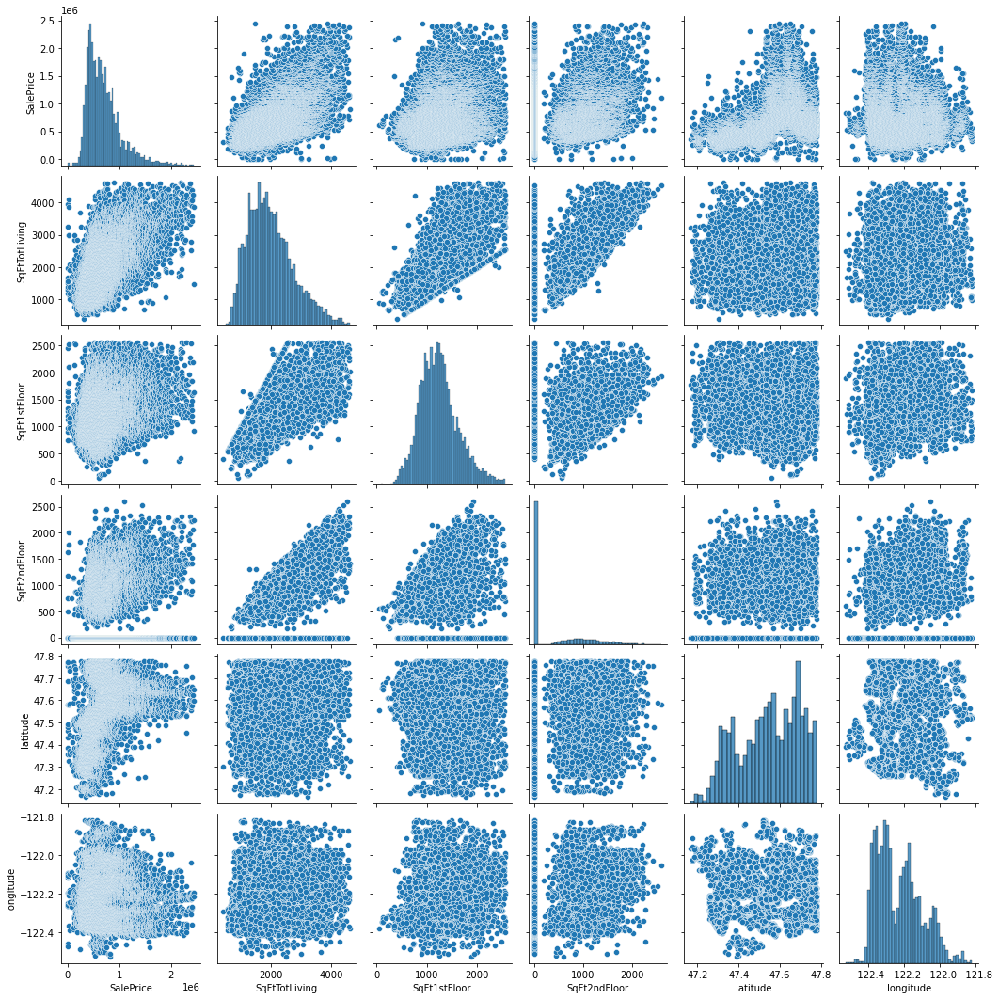

In [244]:
cont_pairplot7 = ['SalePrice','SqFtTotLiving','SqFt1stFloor','SqFt2ndFloor', 'latitude', 'longitude']
sns.pairplot(df7[cont_pairplot7])

Looking at this I am not convinced by longitude, it is not linear. I will remove it from the next model.

# Model 8 - More outlier removal, drop longitude

In [245]:
df8 = df7.copy()

In [246]:
# get rid of low and probably erroneous home values - I could replace with average home value but few rows impacted only
df8 = df8[df8['SalePrice']> 75000]

# creating category for heat system type
df8['heating'] = 0
df8.loc[(df8['HeatSystem'] == 'Forced Air'),'heating'] = 1

In [247]:
df8[df8.SqFt1stFloor<300]

,Address,BuildingNumber,DirectionPrefix,StreetName,StreetType,DirectionSuffix,ZipCode,Stories,BldgGrade,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtTotLiving,SqFtTotBasement,SqFtFinBasement,FinBasementGrade,SqFtGarageBasement,SqFtGarageAttached,DaylightBasement,SqFtOpenPorch,SqFtEnclosedPorch,SqFtDeck,HeatSystem,HeatSource,BrickStone,ViewUtilization,Bedrooms,BathHalfCount,Bath3qtrCount,BathFullCount,YrBuilt,YrRenovated,Condition,id,Township,Section,QuarterSection,Area,DistrictName,SqFtLot,Access,Topography,InadequateParking,MtRainier,Olympics,Cascades,Territorial,SeattleSkyline,PugetSound,LakeWashington,LakeSammamish,SmallLakeRiverCreek,OtherView,WfntLocation,TrafficNoise,PowerLines,OtherNuisances,AdjacentGreenbelt,Easements,DocumentDate,SalePrice,SaleWarning,address,excellent_view,latitude,longitude,lat_long,dist_to_exp,age,has_basement,has_deck,has_porch,has_renovation,has_problem,heating
1595,3863 21ST AVE SW 98106,3863,,21ST,AVE,SW,98106,2.0,6,260,0,180,0,670,230,230,6,0,0,1,0,0,80,Heat Pump,Electricity,0,0,2,0,2,0,2018,0,3,2848700521,24,13,NE,18,SEATTLE,592,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,02/19/2019,369950,0,"3863 21ST AVE SW, SEATTLE, WA, USA",0,47.568489,-122.360342,"(47.5684889, -122.36034235)",10.876078,1,1,1,0,0,0,0
4894,819 B NW 97TH ST 98117,819,NW,97TH,ST,,98117,3.0,8,220,0,610,610,1440,0,0,0,0,250,0,10,0,0,Radiant,Gas,0,0,3,1,1,2,2008,0,3,6824100020,26,36,NW,39,SEATTLE,1209,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,08/30/2019,497500,1,"819 NW 97TH ST , SEATTLE, WA, USA",0,47.699890,-122.367032,"(47.6998896, -122.3670318)",8.591275,11,0,0,1,0,0,0
5681,1116 A 13TH AVE 98122,1116,,13TH,AVE,,98122,3.0,8,220,0,230,230,680,0,0,0,0,0,0,0,40,190,Heat Pump,Electricity,0,0,2,1,1,0,2018,0,3,2254501216,25,32,NE,15,SEATTLE,375,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,04/18/2019,530000,0,"1116 13TH AVE , SEATTLE, WA, USA",0,47.612099,-122.315205,"(47.6120985, -122.3152046)",5.842945,1,0,1,1,0,0,0
5935,1116 B 13TH AVE 98122,1116,,13TH,AVE,,98122,3.0,8,230,0,210,210,650,0,0,0,0,0,0,0,40,170,Heat Pump,Electricity,0,0,2,1,1,0,2018,0,3,2254501217,25,32,NE,15,SEATTLE,375,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,06/27/2019,545000,0,"1116 13TH AVE , SEATTLE, WA, USA",0,47.612099,-122.315205,"(47.6120985, -122.3152046)",5.842945,1,0,1,1,0,0,0
7145,4262 A WINSLOW PL N 98103,4262,,WINSLOW,PL,N,98103,3.0,8,110,0,550,550,1210,0,0,0,0,200,0,0,0,60,Forced Air,Gas,0,0,2,0,0,2,2006,0,3,5694500374,25,18,NW,43,SEATTLE,1262,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,09/09/2019,604000,0,"4262 WINSLOW PL N, SEATTLE, WA, USA",0,47.659143,-122.346484,"(47.6591433, -122.3464839)",5.550399,13,0,1,0,0,0,1
7150,3905 C SW HUDSON ST 98116,3905,SW,HUDSON,ST,,98116,2.0,8,50,0,550,0,890,290,290,8,0,0,1,0,70,200,Heat Pump,Gas,0,0,3,1,2,1,2016,0,3,7435500110,24,23,NE,48,SEATTLE,1080,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12/16/2019,605000,0,"3905 SW HUDSON ST , SEATTLE, WA, USA",0,47.557377,-122.381690,"(47.55737728571429, -122.38168995918367)",12.660287,3,1,1,1,0,0,0
7771,6342 5TH AVE NE 98115,6342,,5TH,AVE,NE,98115,3.0,7,130,0,370,370,870,0,0,0,0,220,0,0,0,70,Forced Air,Gas,0,0,2,2,1,1,2003,0,3,3359500017,25,8,NW,43,SEATTLE,842,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,08/13/2019,635000,0,"6342 5TH AVE NE, SEATTLE, WA, USA",0,47.675636,-122.323190,"(47.6756362, -122.3231904)",4.374018,16,0,1,0,0,0,1
8013,3636 C WHITMAN AVE N 98103,3636,,WHITMAN,AVE,N,98103,3.0,8,110,0,570,570,1250,0,0,0,0,220,0,0,0,110,Floor-Wall,Gas,0,0,2,1,0,1,2001,0,3,1972202050,25,18,SW,43,SEATTLE,1290,PUBLIC,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,10/07/2019,649950,0,"3636 WHITMAN AVE N, SEATTLE, WA, USA",0,47.651744,-122.345494,"(47.6517436, -122.3454938)",5.487269,18,0,1,0,0,0,0
8613,4414 A MERIDIAN AVE N 98103,4414,,MERIDIAN,AVE,N,98103,3.0,7,120,0,530,530,1180,0,0,0,0,190,0,0,0,0,Forced Air,Gas,0,0,2,1,0,1,2005,0,3,510002520,25,17,NW,43,SEATTLE,1251,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12/13/2019,677000,0,"4414 MERIDIAN AVE N, SEATTLE, WA, USA",0

In [248]:
# get rid of the outliers in the 1st floor category on the low side, they maybe represent stairways or entrance halls.
# setting these first floor values to their second floor equivalents
df8.loc[df8.SqFt1stFloor<300, 'SqFt1stFloor'] = df8['SqFt2ndFloor']

In [249]:
# remove longitude, add new heating feature, remove heatsystem from categoricals
features_8 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude',\
               'dist_to_exp', 'age', 'SalePrice', 'SqFt2ndFloor', 'heating']
categoricals8 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [250]:
cat8_ohe = df8[categoricals8]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder8 = encoder.fit(cat8_ohe)
cat8_ohe = encoder8.transform(cat8_ohe)
cat8_ohe = pd.DataFrame(cat8_ohe, columns = encoder8.get_feature_names())
cont8 = df8[features_8]
cat8_ohe.reset_index(drop=True, inplace=True)
cont8.reset_index(drop=True, inplace=True)
preprocessed8 = pd.concat([cont8, cat8_ohe], axis=1)
X_train8 = preprocessed8.drop('SalePrice', axis=1)
y_train8 = preprocessed8['SalePrice']

In [251]:
X_int8 = sm.add_constant(X_train8)
model8 = sm.OLS(y_train8, X_int8).fit()
model8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     626.6
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:55:41   Log-Likelihood:            -1.9383e+05
No. Observations:               14580   AIC:                         3.879e+05
Df Residuals:                   14463   BIC:                         3.888e+05
Df Model:                         116                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -5.206e+06   3.08e+06     -1.689      0.091   -1.12e+07    8.35e+05
AdjacentGreenbelt   -3045.3908   8060.412     -0.378      0.706   -1.88e+04    1.28e+04
excellent_view       1.677e+05   1.34e+04     12.548      0.000    1.41e+05    1.94e+05
Topography          -1.501e+04   4825.710     -3.111      0.002   -2.45e+04   -5555.549
InadequateParking   -8750.2101   3110.347     -2.813      0.005   -1.48e+04   -2653.532
MtRainier            3.584e+04   1.48e+04      2.414      0.016    6741.577    6.49e+04
Olympics             5.356e+04   1.11e+04      4.847      0.000    3.19e+04    7.52e+04
Cascades            -6383.2312   9031.830     -0.707      0.480   -2.41e+04    1.13e+04
Territorial          -206.6545   6343.592     -0.033      0.974   -1.26e+04    1.22e+04
SeattleSkyline       8.627e+04   1.44e+04      5.975      0.000     5.8e+04    1.15e+05
PugetSound           6.242e+04   9990.013      6.248      0.000    4.28e+04     8.2e+04
LakeWashington       1.849e+05   9765.566     18.934      0.000    1.66e+05    2.04e+05
LakeSammamish         1.71e+05   1.99e+04      8.574      0.000    1.32e+05     2.1e+05
SmallLakeRiverCreek  -6.46e+04   1.85e+04     -3.486      0.000   -1.01e+05   -2.83e+04
OtherView           -7.637e+04   2.19e+04     -3.495      0.000   -1.19e+05   -3.35e+04
WfntLocation         3.122e+05    1.7e+04     18.344      0.000    2.79e+05    3.46e+05
Easements             2.37e+04   9141.382      2.593      0.010    5785.352    4.16e+04
SaleWarning         -9.838e+04   5228.691    -18.814      0.000   -1.09e+05   -8.81e+04
ViewUtilization      7.317e+04   9607.614      7.616      0.000    5.43e+04     9.2e+04
has_porch            1.834e+04   2600.589      7.052      0.000    1.32e+04    2.34e+04
has_renovation       6.816e+04   5823.667     11.704      0.000    5.67e+04    7.96e+04
has_basement         5675.3354   3758.960      1.510      0.131   -1692.707     1.3e+04
TrafficNoise        -2.705e+04   3552.205     -7.614      0.000    -3.4e+04   -2.01e+04
has_problem         -1.922e+04   6422.765     -2.993      0.003   -3.18e+04   -6631.835
SqFtTotLiving         131.4450      4.277     30.730      0.000     123.061     139.829
SqFt1stFloor           51.6644      5.813      8.888      0.000      40.270      63.059
latitude             1.124e+05   6.51e+04      1.727      0.084   -1.52e+04     2.4e+05
dist_to_exp         -9236.0106    783.106    -11.794      0.000   -1.08e+04   -7701.022
age                   449.3869     70.680      6.358      0.000     310.844     587.930
SqFt2ndFloor           46.0023      4.643      9.908      0.000      36.901      55.103
heating             -9930.1493   3700.587     -2.683      0.007   -1.72e+04   -2676.526
x0_Gas               1.306e+04   3949.175      3.307      0.001    5319.479    2.08e+04
x0_

In [252]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg8 = linreg.fit(X_train8, y_train8)

scores8 = cross_val_score(
            linreg8, 
            X_train8,
            y_train8,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores8 = np.sqrt(-scores8)
display(rmse_scores8)
display(rmse_scores8.mean())
display(rmse_scores8.std())

array([133767.39944664,  94138.25091176,  91809.60378907, 105035.06376526,
       124450.34442038, 120530.46811026, 127213.05287854, 139894.53089821,
       157639.61180337, 488131.26009583])

158260.95861193296

111643.75578564298

In [253]:
summary.loc[7] = ['Multiple Linear Model 6', 'MLP 5 outliers longitude removed', model8.df_model, round(model8.rsquared,3)\
                  , round(model8.rsquared_adj,3), int(rmse_scores8.mean()), int(rmse_scores8.std()),\
                  round((sms.jarque_bera(model8.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.0,146517.0,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.0,118312.0,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.0,118703.0,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.0,111643.0,32901.0


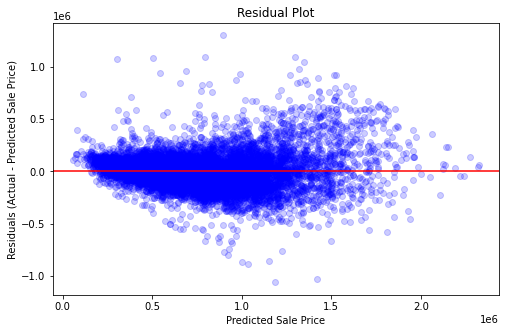

In [254]:
get_resid(preprocessed8, model8)

# Model 9 - YES I FORGOT BATHROOMS!!

In [255]:
df9 = df8.copy()

In [256]:
df9.columns

Index(['Address', 'BuildingNumber', 'DirectionPrefix', 'StreetName',
       'StreetType', 'DirectionSuffix', 'ZipCode', 'Stories', 'BldgGrade',
       'SqFt1stFloor', 'SqFtHalfFloor', 'SqFt2ndFloor', 'SqFtUpperFloor',
       'SqFtTotLiving', 'SqFtTotBasement', 'SqFtFinBasement',
       'FinBasementGrade', 'SqFtGarageBasement', 'SqFtGarageAttached',
       'DaylightBasement', 'SqFtOpenPorch', 'SqFtEnclosedPorch', 'SqFtDeck',
       'HeatSystem', 'HeatSource', 'BrickStone', 'ViewUtilization', 'Bedrooms',
       'BathHalfCount', 'Bath3qtrCount', 'BathFullCount', 'YrBuilt',
       'YrRenovated', 'Condition', 'id', 'Township', 'Section',
       'QuarterSection', 'Area', 'DistrictName', 'SqFtLot', 'Access',
       'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView', 'WfntLocation',
       'TrafficNoise', 'PowerLines', 'OtherNuisances', 'Adjace

In [257]:
df9['bathrooms'] = df9['BathHalfCount']*0.5 + df9['Bath3qtrCount']*0.75 + df9['BathFullCount']

In [258]:
df9.bathrooms.value_counts()

2.50    3404
1.75    2444
1.00    2407
2.25    1495
2.00    1409
1.50    1006
2.75     930
3.00     492
3.50     386
3.25     376
3.75      68
4.00      54
4.25      38
0.75      35
4.50      16
1.25      12
4.75       4
5.25       2
6.25       1
5.50       1
Name: bathrooms, dtype: int64

In [259]:
df9['bedbath'] = df9.Bedrooms - df9.bathrooms

In [260]:
df9.bedbath.value_counts()

 1.50    2373
 1.00    2076
 1.25    2072
 0.50    1798
 2.00    1680
 0.75    1025
 2.25     778
 1.75     636
 0.25     492
 2.50     432
 3.00     305
 0.00     262
-0.25     157
-0.50     154
 3.25     107
 2.75      93
 3.50      49
 4.00      32
-0.75      19
 4.25      13
-1.25       8
-1.00       7
 4.50       5
 3.75       5
-1.50       2
Name: bedbath, dtype: int64

In [261]:
df9.bathbins = 0
df9.loc[(df9['bedbath'] < 1),'bathbins'] = 'less than 1'
df9.loc[(df9['bedbath'] > 0.99) & (df9['bedbath'] < 2), 'bathbins'] = '1 to 2'
df9.loc[(df9['bedbath'] > 1.99), 'bathbins'] = 'greater than 2'

In [262]:
df9.head()

,Address,BuildingNumber,DirectionPrefix,StreetName,StreetType,DirectionSuffix,ZipCode,Stories,BldgGrade,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtTotLiving,SqFtTotBasement,SqFtFinBasement,FinBasementGrade,SqFtGarageBasement,SqFtGarageAttached,DaylightBasement,SqFtOpenPorch,SqFtEnclosedPorch,SqFtDeck,HeatSystem,HeatSource,BrickStone,ViewUtilization,Bedrooms,BathHalfCount,Bath3qtrCount,BathFullCount,YrBuilt,YrRenovated,Condition,id,Township,Section,QuarterSection,Area,DistrictName,SqFtLot,Access,Topography,InadequateParking,MtRainier,Olympics,Cascades,Territorial,SeattleSkyline,PugetSound,LakeWashington,LakeSammamish,SmallLakeRiverCreek,OtherView,WfntLocation,TrafficNoise,PowerLines,OtherNuisances,AdjacentGreenbelt,Easements,DocumentDate,SalePrice,SaleWarning,address,excellent_view,latitude,longitude,lat_long,dist_to_exp,age,has_basement,has_deck,has_porch,has_renovation,has_problem,heating,bathrooms,bedbath,bathbins
27,5131 S 324TH ST 98001,5131,S,324TH,ST,,98001,2.0,7,1290,0,751,0,2041,0,0,0,0,0,0,0,0,0,Forced Air,Gas,0,0,3,1,0,2,1991,0,3,9262800198,21,14,NW,27,AUBURN,28143,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,03/11/2019,76165,1,"5131 S 324TH ST , AUBURN, WA, USA",0,47.311102,-122.269693,"(47.3111016, -122.26969285263652)",12.575918,28,0,0,0,0,0,1,2.50,0.50,less than 1
28,26636 188TH AVE SE 98042,26636,,188TH,AVE,SE,98042,1.0,7,910,0,0,0,1710,800,800,7,0,410,1,0,0,40,Forced Air,Electricity,0,0,4,0,0,2,1977,0,3,8651442920,22,30,SE,86,COVINGTON,5200,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,01/30/2019,76940,0,"26636 188TH AVE SE, COVINGTON, WA, USA",0,47.363496,-122.089727,"(47.363496, -122.0897269241573)",4.621616,42,1,1,0,0,0,1,2.00,2.00,greater than 2
29,21058 98TH AVE S 98031,21058,,98TH,AVE,S,98031,1.0,7,1280,0,0,0,1280,0,0,0,0,260,0,0,0,0,Forced Air,Gas,0,0,3,1,0,1,1963,0,3,9320600120,22,7,NE,59,KENT,9373,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,01/10/2019,82555,1,"21058 98TH AVE S, KENT, WA, USA",0,47.411999,-122.209801,"(47.41199925, -122.20980134073984)",5.904907,56,0,0,0,0,0,1,1.50,1.50,1 to 2
32,8709 14TH AVE NW 98117,8709,,14TH,AVE,NW,98117,1.5,7,870,390,0,0,1260,0,0,0,0,0,0,0,0,60,Forced Air,Gas,0,0,2,0,1,1,1945,0,4,7515000145,26,36,SW,6,SEATTLE,3952,PUBLIC,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,01/07/2019,94341,1,"8709 14TH AVE NW, SEATTLE, WA, USA",0,47.692692,-122.374682,"(47.6926921, -122.3746822392243)",8.665666,74,0,1,0,0,1,1,1.75,0.25,less than 1
33,7045 S 125TH ST 98178,7045,S,125TH,ST,,98178,1.0,6,1280,0,0,0,1280,0,0,0,0,0,0,40,0,0,Elec BB,Electricity,0,0,4,0,0,1,1943,0,3,7689600345,23,12,SW,25,KING COUNTY,7200,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,02/05/2019,94500,0,"7045 S 125TH ST , KING COUNTY, WA, USA",0,47.490407,-122.244396,"(47.4904066, -122.24439577704742)",7.687969,76,0,0,1,0,0,0,1.00,3.00,greater than 2


In [263]:
df9['bathbins'].value_counts()

1 to 2            7157
less than 1       3924
greater than 2    3499
Name: bathbins, dtype: int64

I will experiment with these bathroom columns and see what happens to the model r-squared.

In [264]:
#add bedbath and also the bathbins 
features_9 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude',\
               'dist_to_exp', 'age', 'SalePrice', 'SqFt2ndFloor', 'heating', 'bedbath']
categoricals9 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade', 'bathbins']

In [265]:
cat9_ohe = df9[categoricals9]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder9 = encoder.fit(cat9_ohe)
cat9_ohe = encoder9.transform(cat9_ohe)
cat9_ohe = pd.DataFrame(cat9_ohe, columns = encoder9.get_feature_names())
cont9 = df9[features_9]
cat9_ohe.reset_index(drop=True, inplace=True)
cont9.reset_index(drop=True, inplace=True)
preprocessed9 = pd.concat([cont9, cat9_ohe], axis=1)
X_train9 = preprocessed9.drop('SalePrice', axis=1)
y_train9 = preprocessed9['SalePrice']

In [266]:
X_int9 = sm.add_constant(X_train9)
model9 = sm.OLS(y_train9, X_int9).fit()
model9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     615.9
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:55:53   Log-Likelihood:            -1.9377e+05
No. Observations:               14580   AIC:                         3.878e+05
Df Residuals:                   14460   BIC:                         3.887e+05
Df Model:                         119                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -5.536e+06   3.07e+06     -1.802      0.072   -1.16e+07    4.85e+05
AdjacentGreenbelt   -3097.8335   8033.040     -0.386      0.700   -1.88e+04    1.26e+04
excellent_view       1.664e+05   1.33e+04     12.498      0.000     1.4e+05    1.93e+05
Topography          -1.531e+04   4809.043     -3.183      0.001   -2.47e+04   -5879.993
InadequateParking   -9065.1282   3099.743     -2.924      0.003   -1.51e+04   -2989.236
MtRainier             3.92e+04   1.48e+04      2.650      0.008    1.02e+04    6.82e+04
Olympics             5.445e+04    1.1e+04      4.942      0.000    3.29e+04     7.6e+04
Cascades            -5756.8749   9001.105     -0.640      0.522   -2.34e+04    1.19e+04
Territorial           125.7458   6321.641      0.020      0.984   -1.23e+04    1.25e+04
SeattleSkyline       8.559e+04   1.44e+04      5.948      0.000    5.74e+04    1.14e+05
PugetSound            6.27e+04   9961.320      6.294      0.000    4.32e+04    8.22e+04
LakeWashington       1.844e+05   9731.933     18.951      0.000    1.65e+05    2.04e+05
LakeSammamish        1.732e+05   1.99e+04      8.711      0.000    1.34e+05    2.12e+05
SmallLakeRiverCreek -6.331e+04   1.85e+04     -3.428      0.001   -9.95e+04   -2.71e+04
OtherView           -7.369e+04   2.18e+04     -3.384      0.001   -1.16e+05    -3.1e+04
WfntLocation         3.102e+05    1.7e+04     18.283      0.000    2.77e+05    3.43e+05
Easements            2.426e+04   9111.200      2.662      0.008    6398.465    4.21e+04
SaleWarning         -9.787e+04   5211.346    -18.780      0.000   -1.08e+05   -8.77e+04
ViewUtilization      7.187e+04   9576.883      7.504      0.000    5.31e+04    9.06e+04
has_porch            1.756e+04   2592.851      6.772      0.000    1.25e+04    2.26e+04
has_renovation       5.822e+04   5896.189      9.874      0.000    4.67e+04    6.98e+04
has_basement         1251.6479   3779.429      0.331      0.741   -6156.516    8659.812
TrafficNoise         -2.68e+04   3539.909     -7.570      0.000   -3.37e+04   -1.99e+04
has_problem         -1.896e+04   6401.346     -2.962      0.003   -3.15e+04   -6411.455
SqFtTotLiving         119.0178      4.448     26.756      0.000     110.299     127.737
SqFt1stFloor           54.1480      5.815      9.312      0.000      42.750      65.546
latitude             1.198e+05   6.49e+04      1.847      0.065   -7360.641    2.47e+05
dist_to_exp         -9082.1755    780.570    -11.635      0.000   -1.06e+04   -7552.158
age                   676.7012     74.313      9.106      0.000     531.039     822.364
SqFt2ndFloor           42.3421      4.652      9.102      0.000      33.223      51.461
heating             -9916.0852   3691.002     -2.687      0.007   -1.72e+04   -2681.249
bedbath             -2.942e+04   4841.220     -6.078      0.000   -3.89e+04   -1.99e+04
x0_

In [267]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg9 = linreg.fit(X_train9, y_train9)

scores9 = cross_val_score(
            linreg9, 
            X_train9,
            y_train9,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores9 = np.sqrt(-scores9)
display(rmse_scores9)
display(rmse_scores9.mean())
display(rmse_scores9.std())

array([136573.23762428,  93079.72262869,  91286.49380499, 104015.10493912,
       123038.27338939, 120142.12373929, 126693.01194217, 139849.26307899,
       157474.38517063, 486903.20605155])

157905.4822369088

111436.72335630671

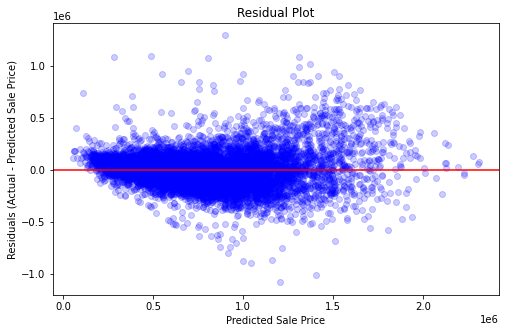

In [268]:
get_resid(df9, model9)

..\..\src\useful_functions.py:70: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


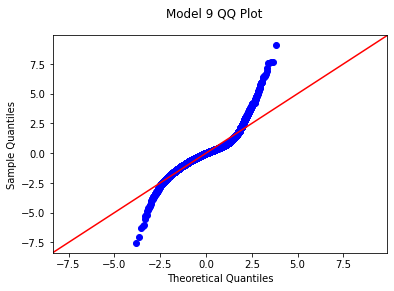

In [269]:
get_qq(model9, 'Model 9');

In [270]:
summary.loc[8] = ['Multiple Linear Model 7', 'MLP 6 + bathrooms', model9.df_model, round(model9.rsquared,3)\
                  , round(model9.rsquared_adj,3), int(rmse_scores9.mean()), int(rmse_scores9.std()),\
                  round((sms.jarque_bera(model9.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.0,342506.0,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.0,168991.0,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.0,158954.0,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.0,153473.0,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.0,146517.0,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.0,118312.0,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.0,118703.0,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.0,111643.0,32901.0
8,Multiple Linear Model 7,MLP 6 + bathrooms,119.0,0.835,0.834,157905.0,111436.0,32792.0


Still quite a high JB number, it would be preferable to reduce this if possible to try and honour normality assumption as best as possible

# Model 10 - Log SalePrice

In [271]:
df10 = df9.copy()

In [272]:
df10['SalePrice_log'] = np.log(df10['SalePrice'])

In [273]:
#replace saleprice with its log equivalent
features_10 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude',\
               'dist_to_exp', 'age', 'SalePrice_log', 'SqFt2ndFloor', 'heating', 'bedbath']

#remove bathbins based on its significance in previous model
categoricals10 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [274]:
cat10_ohe = df10[categoricals10]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder10 = encoder.fit(cat10_ohe)
cat10_ohe = encoder10.transform(cat10_ohe)
cat10_ohe = pd.DataFrame(cat10_ohe, columns = encoder10.get_feature_names())
cont10 = df10[features_10]
cat10_ohe.reset_index(drop=True, inplace=True)
cont10.reset_index(drop=True, inplace=True)
preprocessed10 = pd.concat([cont10, cat10_ohe], axis=1)
X_train10 = preprocessed10.drop('SalePrice_log', axis=1)
y_train10 = preprocessed10['SalePrice_log']

In [275]:
X_int10 = sm.add_constant(X_train10)
model10 = sm.OLS(y_train10, X_int10).fit()
model10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          SalePrice_log   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     724.3
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:56:01   Log-Likelihood:                 4779.2
No. Observations:               14580   AIC:                            -9322.
Df Residuals:                   14462   BIC:                            -8427.
Df Model:                         117                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 -11.1531      3.741     -2.981      0.003     -18.486      -3.820
AdjacentGreenbelt       0.0050      0.010      0.516      0.606      -0.014       0.024
excellent_view          0.1410      0.016      8.694      0.000       0.109       0.173
Topography             -0.0113      0.006     -1.921      0.055      -0.023       0.000
InadequateParking      -0.0037      0.004     -0.993      0.321      -0.011       0.004
MtRainier               0.0995      0.018      5.522      0.000       0.064       0.135
Olympics                0.0510      0.013      3.800      0.000       0.025       0.077
Cascades                0.0080      0.011      0.733      0.464      -0.013       0.030
Territorial             0.0199      0.008      2.582      0.010       0.005       0.035
SeattleSkyline          0.0439      0.018      2.504      0.012       0.010       0.078
PugetSound              0.0755      0.012      6.225      0.000       0.052       0.099
LakeWashington          0.1274      0.012     10.745      0.000       0.104       0.151
LakeSammamish           0.0987      0.024      4.074      0.000       0.051       0.146
SmallLakeRiverCreek    -0.0232      0.022     -1.031      0.302      -0.067       0.021
OtherView              -0.1246      0.027     -4.697      0.000      -0.177      -0.073
WfntLocation            0.3384      0.021     16.375      0.000       0.298       0.379
Easements               0.0284      0.011      2.556      0.011       0.007       0.050
SaleWarning            -0.2094      0.006    -32.996      0.000      -0.222      -0.197
ViewUtilization         0.0403      0.012      3.458      0.001       0.017       0.063
has_porch               0.0251      0.003      7.938      0.000       0.019       0.031
has_renovation          0.0552      0.007      7.692      0.000       0.041       0.069
has_basement            0.0261      0.005      5.666      0.000       0.017       0.035
TrafficNoise           -0.0368      0.004     -8.541      0.000      -0.045      -0.028
has_problem            -0.0305      0.008     -3.910      0.000      -0.046      -0.015
SqFtTotLiving           0.0001   5.42e-06     24.974      0.000       0.000       0.000
SqFt1stFloor          9.75e-05   7.07e-06     13.799      0.000    8.37e-05       0.000
latitude                0.4967      0.079      6.283      0.000       0.342       0.652
dist_to_exp            -0.0111      0.001    -11.717      0.000      -0.013      -0.009
age                     0.0007   9.05e-05      7.495      0.000       0.001       0.001
SqFt2ndFloor         7.186e-05   5.65e-06     12.718      0.000    6.08e-05    8.29e-05
heating                 0.0008      0.004      0.180      0.858      -0.008       0.010
bedbath                -0.0324      0.004     -8.800      0.000      -0.040      -0.025
x0_

In [276]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg10 = linreg.fit(X_train10, y_train10)

scores10 = cross_val_score(
            linreg10, 
            X_train10,
            y_train10,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores10 = np.sqrt(-scores10)
display(rmse_scores10)
display(rmse_scores10.mean())
display(rmse_scores10.std())

array([0.36255092, 0.1377555 , 0.13631791, 0.13927964, 0.15061988,
       0.14368262, 0.14398502, 0.1601419 , 0.16553255, 0.28386607])

0.18237320082567346

0.0731371458561881

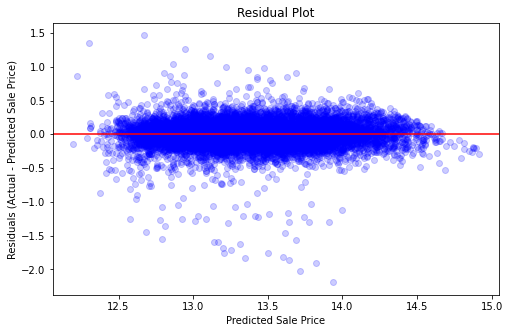

In [277]:
get_logresid(preprocessed10, model10, 'SalePrice_log')

In [278]:
summary.loc[9] = ['Multiple Linear Model 8', 'MLP 7 Log Sale Price', model10.df_model, round(model10.rsquared,3)\
                  , round(model10.rsquared_adj,3), rmse_scores10.mean(), rmse_scores10.std(),\
                  round((sms.jarque_bera(model10.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.000000,342506.000000,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.000000,168991.000000,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.000000,158954.000000,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.000000,153473.000000,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.000000,146517.000000,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.000000,118312.000000,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.000000,118703.000000,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.000000,111643.000000,32901.0
8,Multiple Linear Model 7,MLP 6 + bathrooms,119.0,0.835,0.834,157905.000000,111436.000000,32792.0
9,Multiple Linear Model 8,MLP 7 Log Sale Price,117.0,0.854,0.853,0.182373,0.073137,196501.0


In [279]:
y_hats = linreg10.predict(X_train10)

In [280]:
df10['y_hats'] = y_hats

In [281]:
df10['delta'] = df10['y_hats'] - df10['SalePrice_log']

In [282]:
df10.sort_values('delta').head(100)

,Address,BuildingNumber,DirectionPrefix,StreetName,StreetType,DirectionSuffix,ZipCode,Stories,BldgGrade,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtTotLiving,SqFtTotBasement,SqFtFinBasement,FinBasementGrade,SqFtGarageBasement,SqFtGarageAttached,DaylightBasement,SqFtOpenPorch,SqFtEnclosedPorch,SqFtDeck,HeatSystem,HeatSource,BrickStone,ViewUtilization,Bedrooms,BathHalfCount,Bath3qtrCount,BathFullCount,YrBuilt,YrRenovated,Condition,id,Township,Section,QuarterSection,Area,DistrictName,SqFtLot,Access,Topography,InadequateParking,MtRainier,Olympics,Cascades,Territorial,SeattleSkyline,PugetSound,LakeWashington,LakeSammamish,SmallLakeRiverCreek,OtherView,WfntLocation,TrafficNoise,PowerLines,OtherNuisances,AdjacentGreenbelt,Easements,DocumentDate,SalePrice,SaleWarning,address,excellent_view,latitude,longitude,lat_long,dist_to_exp,age,has_basement,has_deck,has_porch,has_renovation,has_problem,heating,bathrooms,bedbath,bathbins,SalePrice_log,y_hats,delta
14558,17432 SE 392ND ST 98092,17432,SE,392ND,ST,,98092,1.5,6,1637,360,0,0,1997,0,0,0,0,0,0,35,288,0,Forced Air,Gas,0,0,5,0,0,1,1937,0,4,120059046,20,1,NE,28,KING COUNTY,472977,PUBLIC,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,04/10/2019,1375000,1,"17432 SE 392ND ST , KING COUNTY, WA, USA",0,47.250061,-122.106137,"(47.25006126611006, -122.10613672438954)",15.200270,82,0,0,1,0,0,1,1.00,4.00,greater than 2,14.133964,12.669401,-1.464563
11447,25400 173RD AVE SE 98042,25400,,173RD,AVE,SE,98042,1.0,5,910,0,0,0,910,380,0,0,0,0,1,0,0,290,Floor-Wall,Electricity,0,0,2,0,0,1,1953,0,3,2422059015,22,24,SE,86,COVINGTON,295772,PRIVATE,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,04/05/2019,850000,1,"25400 173RD AVE SE, COVINGTON, WA, USA",0,47.372714,-122.110870,"(47.372714, -122.11087)",2.730769,66,1,1,0,0,1,0,1.00,1.00,1 to 2,13.652992,12.302482,-1.350509
14785,6526 25TH AVE NW 98117,6526,,25TH,AVE,NW,98117,1.0,5,680,0,0,0,680,0,0,0,0,0,0,0,0,0,Floor-Wall,Gas,0,0,2,0,0,1,1901,0,4,2856100185,25,2,SW,19,SEATTLE,2550,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,05/29/2019,1480000,1,"6526 25TH AVE NW, SEATTLE, WA, USA",0,47.676680,-122.388355,"(47.6766797, -122.3883550481577)",8.971981,118,0,0,0,0,1,0,1.00,1.00,1 to 2,14.207553,12.944768,-1.262784
14962,23860 NE 8TH ST 98074,23860,NE,8TH,ST,,98074,1.0,6,950,0,0,0,950,0,0,0,0,0,0,0,0,0,Forced Air,Gas,0,0,3,0,0,1,1965,0,4,2725069019,25,27,SE,35,SAMMAMISH,71429,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,11/15/2019,1590000,0,"23860 NE 8TH ST , SAMMAMISH, WA, USA",0,47.616629,-122.016584,"(47.61662929508197, -122.0165836352459)",16.189643,54,0,0,0,0,0,1,1.00,2.00,greater than 2,14.279245,13.113317,-1.165928
13512,22844 SE 1ST ST 98074,22844,SE,1ST,ST,,98074,1.0,6,720,0,0,0,720,0,0,0,0,420,0,0,0,0,Radiant,Electricity,0,0,2,0,0,1,1963,0,4,1241100009,25,34,SW,35,SAMMAMISH,40640,PRIVATE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,02/28/2019,1100000,1,"22844 SE 1ST ST , SAMMAMISH, WA, USA",0,47.608262,-122.035207,"(47.60826154112994, -122.03520730197032)",14.536156,56,0,0,0,0,0,0,1.00,1.00,1 to 2,13.910821,12.864334,-1.046487
14838,38619 180TH AVE SE 98092,38619,,180TH,AVE,SE,98092,2.0,9,1730,0,1300,0,3030,0,0,0,0,790,0,0,0,280,Heat Pump,Electricity,0,0,4,1,0,2,2001,0,3,120059055,20,1,NE,28,KING COUNTY,381162,PUBLIC,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,06/27/2019,1500000,0,"38619 180TH AVE SE, KING COUNTY, WA, USA",0,47.254857,-122.102288,"(47.254857, -122.10228793456376)",14.733366,18,0,1,0,0,0,0,2.50,1.50,1 to 2,14.220976,13.219809,-1.001167
15292,2847 NW 70TH ST 98117,2847,NW,70TH,ST,,98117,1.5,6,880,190,0,0,1950,880,880,6,0,0,0,40,0,0,Forced Air,Gas,0,0,2,0,0,2,1928,0,3,3693900385,25,2,SW,19,SEATTLE,5000,PUBLIC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,08/11/2019,1890000,0,"2847 NW 70TH ST , SEATTLE, WA, USA",0,47.679289,-122.395066,"(47.67928935, -122.39506588352202)",9.532954,91,1,0,1,0,0,1,2.00,0.00,less than 1,14.452087,13.476524,-0.975563
15047,1123 18TH AVE 98122,1123,,18TH,AVE,,98122,1.0,6,900,0,0,0,900,900,0,0,0,0,0,110,0,0,Forced Air,Oil,0,0,2,0,0,1,1924,0,3,7234600901

In [283]:
large_delta = df10.sort_values('delta')[:200]

In [284]:
np.exp(14.356089)

1716999.7598267233

In [285]:
np.exp(13.896574)

1084439.6934462036

out of curiosity I am looking at where I have the biggest discrepancies between the model and reality to see if there is anything I could have missed, a luxury area perhaps. The first property is bamboozling, over 1mil difference, even Zillow says this house is way over priced. 

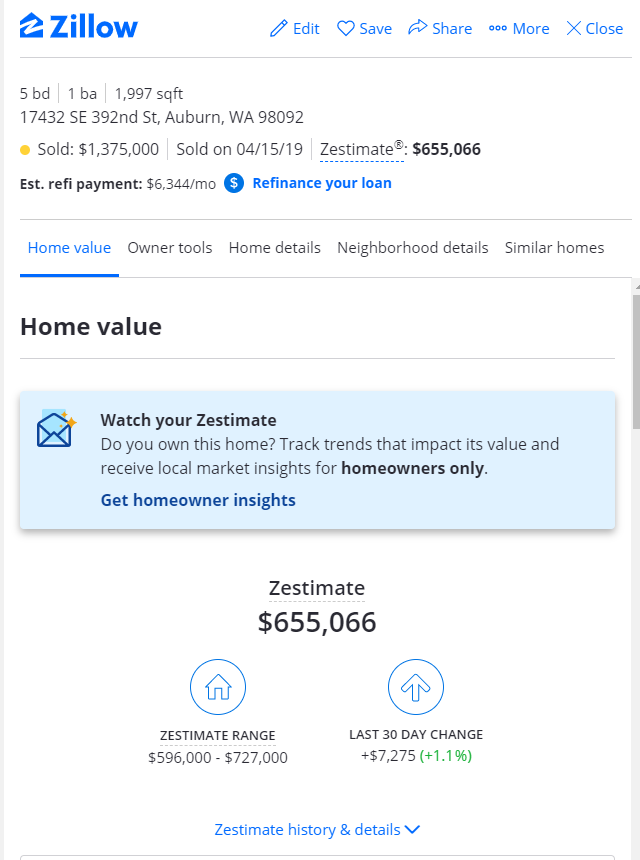

it might be worth plotting these locations on a map to see if there is a pattern

In [286]:
get_map(large_delta)

While there is a good spread of locations here, this gives me confidence I haven't missed one location of interest specifically, it is clear however there is a big premium on properties that extremely closed to water, this isn't surprising but something I thought would be captured in the features that determine whether or not you have a view of a location or the wtftlocation feature itself. The model is therefore not capturing this, with more time I would have liked to engineer a feature that estimates proximity to nearest water body. I could do this in a rudimentary fashion with some coordinates but given the size of some of the water bodies in King County, this could still prove difficult. I also don't believe the increase in price will be linear with distance away from water body and suspect the premium can be applied on one street and then the next street back would have a steep drop off i.e a non linear increase as you approach the coast.

In [287]:
large_delta.WfntLocation.sum()

5

The dataframe which contains the top 200 biggest differences between predicted and actual indicates there are only 5 properties on a waterfront location! Looking at the map it looks like this could be an error in the data gathering side which cannot ever be explained by the model, or the criteria for waterfront location is extremely strict i.e you need to be within 5m of the water! Either way, I think a feature that could better capture this would be valuable.

This model looks ok, let's do one last check on multicollinearity

In [288]:
get_multicol(preprocessed10)

,cc
pairs,


No multicollinearity over 0.75, this is good

# Model 11 - Square Root SalePrice

In [289]:
df11 = df10.copy()

In [290]:
df11['sale_sqrt'] = np.sqrt(df11['SalePrice'])

In [291]:
#replace saleprice with its square rroot equivalent
features_11 = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude',\
               'dist_to_exp', 'age', 'sale_sqrt', 'SqFt2ndFloor', 'heating', 'bedbath']


categoricals11 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [292]:
cat11_ohe = df11[categoricals11]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder11 = encoder.fit(cat11_ohe)
cat11_ohe = encoder11.transform(cat11_ohe)
cat11_ohe = pd.DataFrame(cat11_ohe, columns = encoder11.get_feature_names())
cont11 = df11[features_11]
cat11_ohe.reset_index(drop=True, inplace=True)
cont11.reset_index(drop=True, inplace=True)
preprocessed11 = pd.concat([cont11, cat11_ohe], axis=1)
X_train11 = preprocessed11.drop('sale_sqrt', axis=1)
y_train11 = preprocessed11['sale_sqrt']

In [293]:
X_int11 = sm.add_constant(X_train11)
model11 = sm.OLS(y_train11, X_int11).fit()
model11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              sale_sqrt   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     759.4
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:56:17   Log-Likelihood:                -83091.
No. Observations:               14580   AIC:                         1.664e+05
Df Residuals:                   14462   BIC:                         1.673e+05
Df Model:                         117                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -6177.0263   1550.266     -3.984      0.000   -9215.747   -3138.306
AdjacentGreenbelt       0.9763      4.054      0.241      0.810      -6.971       8.923
excellent_view         76.2998      6.721     11.352      0.000      63.126      89.474
Topography             -6.5203      2.427     -2.686      0.007     -11.278      -1.762
InadequateParking      -3.3323      1.565     -2.130      0.033      -6.399      -0.266
MtRainier              31.3281      7.468      4.195      0.000      16.691      45.965
Olympics               26.0022      5.559      4.677      0.000      15.105      36.899
Cascades                0.6247      4.543      0.138      0.891      -8.280       9.530
Territorial             4.7553      3.191      1.490      0.136      -1.499      11.010
SeattleSkyline         32.6076      7.263      4.490      0.000      18.372      46.844
PugetSound             33.6681      5.025      6.700      0.000      23.819      43.518
LakeWashington         77.0315      4.912     15.682      0.000      67.403      86.660
LakeSammamish          68.0800     10.034      6.785      0.000      48.412      87.748
SmallLakeRiverCreek   -21.1051      9.322     -2.264      0.024     -39.377      -2.833
OtherView             -46.9109     10.992     -4.268      0.000     -68.457     -25.365
WfntLocation          157.3321      8.563     18.374      0.000     140.548     174.116
Easements              12.6190      4.598      2.744      0.006       3.606      21.632
SaleWarning           -68.9848      2.630    -26.230      0.000     -74.140     -63.830
ViewUtilization        28.3855      4.833      5.873      0.000      18.912      37.859
has_porch              10.1808      1.309      7.779      0.000       7.616      12.746
has_renovation         27.5860      2.974      9.275      0.000      21.756      33.416
has_basement            5.6639      1.905      2.973      0.003       1.929       9.399
TrafficNoise          -15.3279      1.787     -8.579      0.000     -18.830     -11.826
has_problem           -11.9730      3.231     -3.706      0.000     -18.305      -5.641
SqFtTotLiving           0.0622      0.002     27.732      0.000       0.058       0.067
SqFt1stFloor            0.0358      0.003     12.224      0.000       0.030       0.042
latitude              139.9314     32.754      4.272      0.000      75.730     204.133
dist_to_exp            -4.9341      0.394    -12.524      0.000      -5.706      -4.162
age                     0.3457      0.037      9.224      0.000       0.272       0.419
SqFt2ndFloor            0.0271      0.002     11.560      0.000       0.022       0.032
heating                -2.4787      1.861     -1.332      0.183      -6.127       1.170
bedbath               -14.9047      1.524     -9.782      0.000     -17.891     -11.918
x0_

In [294]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg11 = linreg.fit(X_train11, y_train11)

scores11 = cross_val_score(
            linreg11, 
            X_train11,
            y_train11,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores11 = np.sqrt(-scores11)
display(rmse_scores11)
display(rmse_scores11.mean())
display(rmse_scores11.std())

array([100.326468  ,  53.94049075,  53.39880434,  57.42571756,
        64.57465925,  62.23652308,  63.71523161,  70.42879379,
        76.60313928, 187.33225625])

78.99820839212325

38.394641698327476

In [295]:
summary.loc[10] = ['Multiple Linear Model 9', 'MLP 7 Sqrt Sale Price', model11.df_model, round(model11.rsquared,3)\
                  , round(model11.rsquared_adj,3), rmse_scores11.mean(), rmse_scores11.std(),\
                  round((sms.jarque_bera(model11.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.000000,342506.000000,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.000000,168991.000000,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.000000,158954.000000,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.000000,153473.000000,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.000000,146517.000000,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.000000,118312.000000,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.000000,118703.000000,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.000000,111643.000000,32901.0
8,Multiple Linear Model 7,MLP 6 + bathrooms,119.0,0.835,0.834,157905.000000,111436.000000,32792.0
9,Multiple Linear Model 8,MLP 7 Log Sale Price,117.0,0.854,0.853,0.182373,0.073137,196501.0


# Model 12 - Cube Root other continuous variables 

In [296]:
df12 = df11.copy()

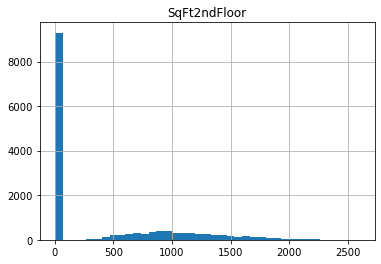

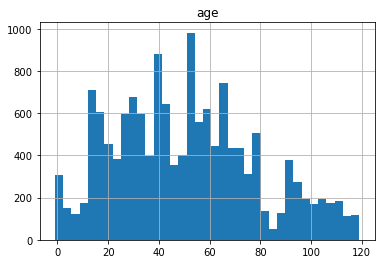

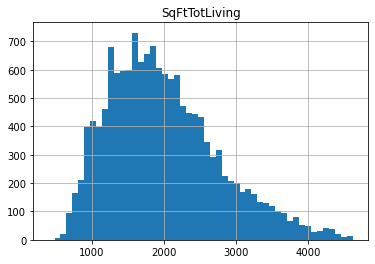

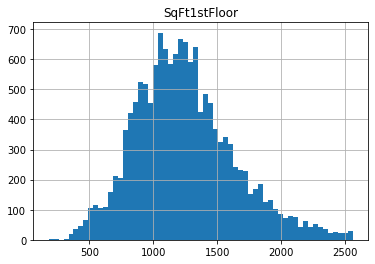

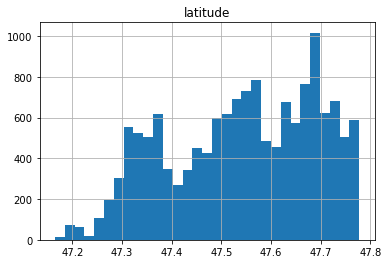

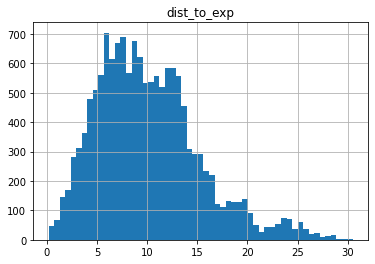

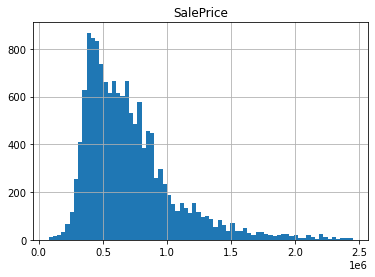

In [297]:
cont_12 = ['SqFt2ndFloor', 'age', 'SqFtTotLiving', 'SqFt1stFloor', 'latitude', 'dist_to_exp', 'SalePrice']
for col in cont_12:
    df12[col].hist(bins='auto')
    plt.title(col)
    plt.show()
       
    

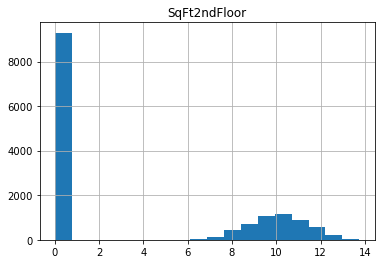

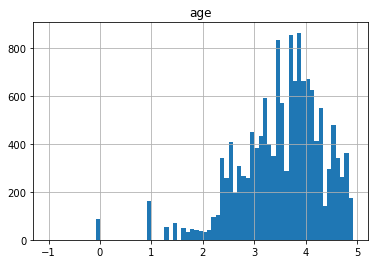

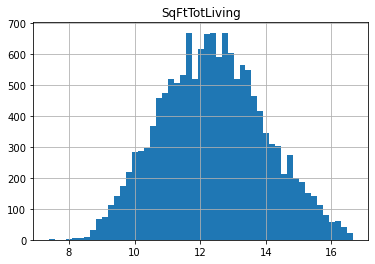

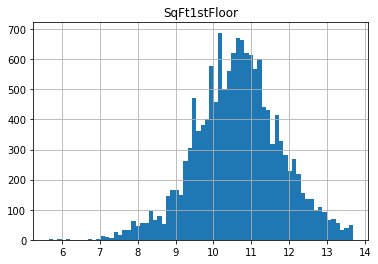

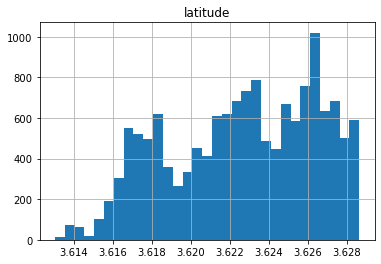

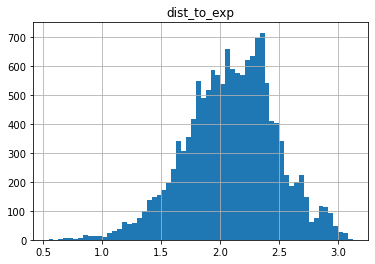

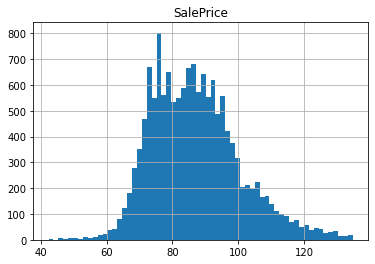

In [298]:
for col in cont_12:
    np.cbrt(df12[col]).hist(bins='auto')
    plt.title(col)
    plt.show()
    

In [299]:
df12['duplex'] = 0
df12.loc[(df12['SqFt2ndFloor'] > 0),'duplex'] = 1

In [300]:
# cube root transform those that make sense
df12['SqFtTotLiving_cb'] = np.cbrt(df12['SqFtTotLiving'])
df12['SqFt1stFloor_cb'] = np.cbrt(df12['SqFt1stFloor'])
df12['dist_to_exp_cb'] = np.cbrt(df12['dist_to_exp'])
df12['SalePrice_cb'] = np.cbrt(df12['SalePrice'])

In [301]:
#remove adjacent greenbelt as it has been consistently insignificant
features_12 = ['excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',\
               'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish', 'SmallLakeRiverCreek',\
               'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization', 'has_porch', 'has_renovation',\
              'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving_cb', 'SqFt1stFloor_cb', 'latitude',\
               'dist_to_exp_cb', 'age', 'SalePrice_cb', 'duplex', 'heating', 'bedbath']


categoricals12 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [302]:
cat12_ohe = df12[categoricals12]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder12 = encoder.fit(cat12_ohe)
cat12_ohe = encoder12.transform(cat12_ohe)
cat12_ohe = pd.DataFrame(cat12_ohe, columns = encoder12.get_feature_names())
cont12 = df12[features_12]
cat12_ohe.reset_index(drop=True, inplace=True)
cont12.reset_index(drop=True, inplace=True)
preprocessed12 = pd.concat([cont12, cat12_ohe], axis=1)
X_train12 = preprocessed12.drop('SalePrice_cb', axis=1)
y_train12 = preprocessed12['SalePrice_cb']

In [303]:
X_int12 = sm.add_constant(X_train12)
model12 = sm.OLS(y_train12, X_int12).fit()
model12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           SalePrice_cb   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     766.8
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:56:30   Log-Likelihood:                -44288.
No. Observations:               14580   AIC:                         8.881e+04
Df Residuals:                   14463   BIC:                         8.970e+04
Df Model:                         116                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                -515.7565    108.112     -4.771      0.000    -727.670    -303.843
excellent_view          4.8105      0.469     10.249      0.000       3.891       5.731
Topography             -0.4319      0.169     -2.549      0.011      -0.764      -0.100
InadequateParking      -0.2105      0.110     -1.922      0.055      -0.425       0.004
MtRainier               2.4528      0.522      4.702      0.000       1.430       3.475
Olympics                1.7525      0.388      4.513      0.000       0.991       2.514
Cascades                0.1905      0.317      0.600      0.548      -0.431       0.813
Territorial             0.3874      0.223      1.738      0.082      -0.049       0.824
SeattleSkyline          1.8789      0.507      3.705      0.000       0.885       2.873
PugetSound              2.2702      0.351      6.470      0.000       1.582       2.958
LakeWashington          4.6887      0.344     13.637      0.000       4.015       5.363
LakeSammamish           4.2133      0.701      6.014      0.000       2.840       5.586
SmallLakeRiverCreek    -1.1339      0.651     -1.741      0.082      -2.410       0.142
OtherView              -3.4644      0.768     -4.512      0.000      -4.969      -1.960
WfntLocation           10.6881      0.598     17.869      0.000       9.516      11.861
Easements               0.7633      0.321      2.379      0.017       0.134       1.392
SaleWarning            -5.2125      0.184    -28.374      0.000      -5.573      -4.852
ViewUtilization         1.7185      0.338      5.083      0.000       1.056       2.381
has_porch               0.8608      0.091      9.439      0.000       0.682       1.040
has_renovation          1.8617      0.208      8.952      0.000       1.454       2.269
has_basement           -0.1402      0.126     -1.114      0.265      -0.387       0.107
TrafficNoise           -1.0805      0.125     -8.659      0.000      -1.325      -0.836
has_problem            -0.8006      0.226     -3.548      0.000      -1.243      -0.358
SqFtTotLiving_cb        2.3014      0.070     33.038      0.000       2.165       2.438
SqFt1stFloor_cb         0.7680      0.073     10.487      0.000       0.624       0.912
latitude               11.8160      2.283      5.175      0.000       7.340      16.292
dist_to_exp_cb         -4.6664      0.330    -14.123      0.000      -5.314      -4.019
age                     0.0181      0.003      6.816      0.000       0.013       0.023
duplex                  0.8270      0.168      4.918      0.000       0.497       1.157
heating                -0.1912      0.130     -1.471      0.141      -0.446       0.064
bedbath                -1.0599      0.108     -9.809      0.000      -1.272      -0.848
x0_Gas                  0.5118      0.139      3.688      0.000       0.240       0.784
x0_

In [304]:
# I will now check run the model using sk-learn
linreg = LinearRegression()

# Fit on training data
linreg12 = linreg.fit(X_train12, y_train12)

scores12 = cross_val_score(
            linreg12, 
            X_train12,
            y_train12,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores12 = np.sqrt(-scores12)
display(rmse_scores12)
display(rmse_scores12.mean())
display(rmse_scores12.std())

array([ 8.06316755,  3.91180931,  3.83752411,  4.0072848 ,  4.42454561,
        4.28207045,  4.37027759,  4.89214596,  5.18684188, 11.64592415])

5.46215914199116

2.371203248306395

In [305]:
summary.loc[11] = ['Multiple Linear Model 10', 'MLP 7 cbrt Sale Price - adjacentGreen', model12.df_model, round(model12.rsquared,3)\
                  , round(model12.rsquared_adj,3), rmse_scores12.mean(), rmse_scores12.std(),\
                  round((sms.jarque_bera(model12.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.000000,342506.000000,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.000000,168991.000000,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.000000,158954.000000,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.000000,153473.000000,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.000000,146517.000000,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.000000,118312.000000,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.000000,118703.000000,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.000000,111643.000000,32901.0
8,Multiple Linear Model 7,MLP 6 + bathrooms,119.0,0.835,0.834,157905.000000,111436.000000,32792.0
9,Multiple Linear Model 8,MLP 7 Log Sale Price,117.0,0.854,0.853,0.182373,0.073137,196501.0


one last check on multicollinearity...

# Model 13 - MLM 7b Last attempt to increase Normality Assumption 

In [306]:
# Create duplex column to remove SqFt2ndFloor 
df9['duplex'] = 0
df9.loc[(df9['SqFt2ndFloor'] > 0),'duplex'] = 1

In [307]:
features_9

['AdjacentGreenbelt',
 'excellent_view',
 'Topography',
 'InadequateParking',
 'MtRainier',
 'Olympics',
 'Cascades',
 'Territorial',
 'SeattleSkyline',
 'PugetSound',
 'LakeWashington',
 'LakeSammamish',
 'SmallLakeRiverCreek',
 'OtherView',
 'WfntLocation',
 'Easements',
 'SaleWarning',
 'ViewUtilization',
 'has_porch',
 'has_renovation',
 'has_basement',
 'TrafficNoise',
 'has_problem',
 'SqFtTotLiving',
 'SqFt1stFloor',
 'latitude',
 'dist_to_exp',
 'age',
 'SalePrice',
 'SqFt2ndFloor',
 'heating',
 'bedbath']

In [308]:
rows1 = df9[['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving',\
                      'SqFt1stFloor', 'latitude', 'dist_to_exp', 'age', 'SalePrice', 'SqFt2ndFloor', 'heating', 'bedbath']].values

vif_df1 = pd.DataFrame()
vif_df1["VIF"] = [variance_inflation_factor(rows1, i) for i in range(32)]
vif_df1["feature"] = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving',\
                      'SqFt1stFloor', 'latitude', 'dist_to_exp', 'age', 'SalePrice', 'SqFt2ndFloor', 'heating', 'bedbath']

vif_df1

,VIF,feature
0,1.064298,AdjacentGreenbelt
1,1.432768,excellent_view
2,1.185921,Topography
3,2.568941,InadequateParking
4,1.120000,MtRainier
5,1.794581,Olympics
6,1.522574,Cascades
7,2.515150,Territorial
8,1.171936,SeattleSkyline
9,1.871353,PugetSound


In [309]:
# remove latitude, 
rows2 = df9[['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving',\
                      'SqFt1stFloor', 'dist_to_exp', 'age', 'SalePrice', 'heating', 'bedbath',\
                        'duplex']].values

vif_df2 = pd.DataFrame()
vif_df2["VIF"] = [variance_inflation_factor(rows2, i) for i in range(31)]
vif_df2["feature"] = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem', 'SqFtTotLiving',\
                      'SqFt1stFloor', 'dist_to_exp', 'age', 'SalePrice', 'heating', 'bedbath',\
                        'duplex']

vif_df2

,VIF,feature
0,1.063141,AdjacentGreenbelt
1,1.431977,excellent_view
2,1.183737,Topography
3,2.478906,InadequateParking
4,1.119793,MtRainier
5,1.794183,Olympics
6,1.519588,Cascades
7,2.514902,Territorial
8,1.171464,SeattleSkyline
9,1.858630,PugetSound


In [310]:
rows3 = df9[['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem',\
                      'SqFt1stFloor', 'dist_to_exp', 'age', 'heating', 'bedbath',\
                        'duplex']].values

vif_df3 = pd.DataFrame()
vif_df3["VIF"] = [variance_inflation_factor(rows3, i) for i in range(29)]
vif_df3["feature"] = ['AdjacentGreenbelt', 'excellent_view', 'Topography', 'InadequateParking', 'MtRainier', 'Olympics',\
                     'Cascades', 'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington', 'LakeSammamish',\
                     'SmallLakeRiverCreek', 'OtherView', 'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',\
                      'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise', 'has_problem',\
                      'SqFt1stFloor', 'dist_to_exp', 'age', 'heating', 'bedbath',\
                        'duplex']

vif_df3

,VIF,feature
0,1.059418,AdjacentGreenbelt
1,1.426628,excellent_view
2,1.179818,Topography
3,2.461651,InadequateParking
4,1.119747,MtRainier
5,1.790585,Olympics
6,1.518483,Cascades
7,2.510640,Territorial
8,1.165198,SeattleSkyline
9,1.855271,PugetSound


In [311]:
vif_df3.feature.values

array(['AdjacentGreenbelt', 'excellent_view', 'Topography',
       'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView',
       'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',
       'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise',
       'has_problem', 'SqFt1stFloor', 'dist_to_exp', 'age', 'heating',
       'bedbath', 'duplex'], dtype=object)

In [312]:
df13 = df9.copy()

In [313]:
features_13 = ['AdjacentGreenbelt', 'excellent_view', 'Topography',
       'InadequateParking', 'MtRainier', 'Olympics', 'Cascades',
       'Territorial', 'SeattleSkyline', 'PugetSound', 'LakeWashington',
       'LakeSammamish', 'SmallLakeRiverCreek', 'OtherView',
       'WfntLocation', 'Easements', 'SaleWarning', 'ViewUtilization',
       'has_porch', 'has_renovation', 'has_basement', 'TrafficNoise',
       'has_problem', 'SqFt1stFloor','SalePrice', 'dist_to_exp', 'age', 'heating',
       'bedbath', 'duplex']
categoricals13 = ['HeatSource', 'Access', 'ZipCode', 'Condition', 'Bedrooms', 'BldgGrade']

In [314]:
cat13_ohe = df13[categoricals13]
encoder = OneHotEncoder(drop='first', sparse=False)
encoder13 = encoder.fit(cat13_ohe)
cat13_ohe = encoder13.transform(cat13_ohe)
cat13_ohe = pd.DataFrame(cat13_ohe, columns = encoder13.get_feature_names())
cont13 = df13[features_13]
cat13_ohe.reset_index(drop=True, inplace=True)
cont13.reset_index(drop=True, inplace=True)
preprocessed13 = pd.concat([cont13, cat13_ohe], axis=1)
X_train13 = preprocessed13.drop('SalePrice', axis=1)
y_train13 = preprocessed13['SalePrice']

In [315]:
X_int13 = sm.add_constant(X_train13)
model13 = sm.OLS(y_train13, X_int13).fit()
model13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     568.0
Date:                Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:56:45   Log-Likelihood:            -1.9447e+05
No. Observations:               14580   AIC:                         3.892e+05
Df Residuals:                   14464   BIC:                         3.901e+05
Df Model:                         115                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                1.738e+05   2.13e+04      8.158      0.000    1.32e+05    2.16e+05
AdjacentGreenbelt    8757.5503   8414.718      1.041      0.298   -7736.374    2.53e+04
excellent_view       1.651e+05    1.4e+04     11.827      0.000    1.38e+05    1.92e+05
Topography          -1.049e+04   5037.489     -2.083      0.037   -2.04e+04    -616.938
InadequateParking   -7952.4105   3244.484     -2.451      0.014   -1.43e+04   -1592.807
MtRainier            4.223e+04   1.55e+04      2.724      0.006    1.18e+04    7.26e+04
Olympics             6.275e+04   1.15e+04      5.434      0.000    4.01e+04    8.54e+04
Cascades              784.5289   9432.227      0.083      0.934   -1.77e+04    1.93e+04
Territorial          7011.4726   6624.090      1.058      0.290   -5972.591       2e+04
SeattleSkyline       8.344e+04   1.51e+04      5.531      0.000    5.39e+04    1.13e+05
PugetSound           6.608e+04   1.04e+04      6.331      0.000    4.56e+04    8.65e+04
LakeWashington       1.924e+05   1.02e+04     18.883      0.000    1.72e+05    2.12e+05
LakeSammamish        1.794e+05   2.08e+04      8.617      0.000    1.39e+05     2.2e+05
SmallLakeRiverCreek -5.816e+04   1.94e+04     -3.002      0.003   -9.61e+04   -2.02e+04
OtherView           -7.493e+04   2.28e+04     -3.281      0.001    -1.2e+05   -3.02e+04
WfntLocation         3.101e+05   1.78e+04     17.432      0.000    2.75e+05    3.45e+05
Easements            2.126e+04   9547.595      2.226      0.026    2542.549       4e+04
SaleWarning         -1.003e+05   5464.057    -18.356      0.000   -1.11e+05   -8.96e+04
ViewUtilization      6.722e+04   1.01e+04      6.685      0.000    4.75e+04    8.69e+04
has_porch            2.845e+04   2702.822     10.527      0.000    2.32e+04    3.37e+04
has_renovation       5.459e+04   6187.913      8.822      0.000    4.25e+04    6.67e+04
has_basement         2.946e+04   3365.849      8.751      0.000    2.29e+04    3.61e+04
TrafficNoise        -2.711e+04   3712.427     -7.303      0.000   -3.44e+04   -1.98e+04
has_problem         -2.107e+04   6711.891     -3.140      0.002   -3.42e+04   -7916.377
SqFt1stFloor          140.2987      4.864     28.847      0.000     130.765     149.832
dist_to_exp         -9294.7787    813.729    -11.422      0.000   -1.09e+04   -7699.765
age                   830.6921     78.309     10.608      0.000     677.197     984.187
heating             -8617.8699   3864.972     -2.230      0.026   -1.62e+04   -1042.031
bedbath             -6.606e+04   3048.684    -21.670      0.000    -7.2e+04   -6.01e+04
duplex               6.882e+04   4448.021     15.471      0.000    6.01e+04    7.75e+04
x0_Gas               1.483e+04   4127.416      3.594      0.000    6743.640    2.29e+04
x0_Oil               2.199e+04   5471.637      4.018      0.000    1.13e+04    3.27e+04
x1_

In [316]:
linreg = LinearRegression()

# Fit on training data
linreg13 = linreg.fit(X_train13, y_train13)

scores13 = cross_val_score(
            linreg13, 
            X_train13,
            y_train13,
            cv=10,
            scoring="neg_mean_squared_error"
)

rmse_scores13 = np.sqrt(-scores13)
display(rmse_scores13)
display(rmse_scores13.mean())
display(rmse_scores13.std())

array([137988.04116617,  94639.78237832,  95193.03493616, 104641.89471948,
       125094.59041674, 125687.48813862, 131919.64269569, 149610.16447537,
       168680.72255955, 503370.98136782])

163682.63428539137

115393.45995078197

In [317]:
summary.loc[12] = ['Multiple Linear Model 7b', 'MLP 7 reduced features due to VIF', model13.df_model, round(model13.rsquared,3)\
                  , round(model13.rsquared_adj,3), rmse_scores13.mean(), rmse_scores13.std(),\
                  round((sms.jarque_bera(model13.resid)[0]),0)]

summary

,Model,Description,No. Features,R^2,Adj R^2,RMSE,RMSE sd,JB
0,Simple Model - one independent variable,Square ft Total living,1.0,0.389,0.389,398611.000000,342506.000000,9825842.0
1,Simple Model - outliers removed,Square ft Total living,1.0,0.354,0.354,294579.000000,168991.000000,7132.0
2,Multiple Linear Model 1,Continuous features,4.0,0.535,0.535,238663.000000,158954.000000,18348.0
3,Multiple Linear Model 2,Continuous features + age/dist_to_exp,6.0,0.567,0.566,236962.000000,153473.000000,16023.0
4,Multiple Linear Model 3,continuous + binary features,29.0,0.622,0.622,227275.000000,146517.000000,16416.0
5,Multiple Linear Model 4,continuous + binary features + cat,139.0,0.816,0.814,166951.000000,118312.000000,165256.0
6,Multiple Linear Model 5,MLP 4 + SqFt2nd + Clean Cat,123.0,0.823,0.821,164932.000000,118703.000000,206712.0
7,Multiple Linear Model 6,MLP 5 outliers longitude removed,116.0,0.834,0.833,158260.000000,111643.000000,32901.0
8,Multiple Linear Model 7,MLP 6 + bathrooms,119.0,0.835,0.834,157905.000000,111436.000000,32792.0
9,Multiple Linear Model 8,MLP 7 Log Sale Price,117.0,0.854,0.853,0.182373,0.073137,196501.0


# Summary 

## General Findings

The final model that will be used to advise on the potential home improvements will be MLM7. 

With an R-squared of 83.5 it explains 83.5% of the variance in the Sale price. This seems reasonable for relatively simple model. 

Other models achieved higher R-squared numbers but the JB number suffered, meaning the coefficients were likely to be less reliable.

With the transformed variables, interpretation of variables can become problematic beyong the standard log transformation and for such marginal improvement in the R-squared, sacrificing a couple % on R-squared for both ease of interpretation and better attempt at honouring normality seems to make sense. 

I have worked to reduce the JB number and try to ensure the model honours the normality assumption but clearly this could be improved upon. As such the recommendations for home improvement will have to come with a bold caveat next to them - this model is far from perfect. 



### Interpretation of Coeffients


#### Square footage

For every one square foot of total living space you add to a property, its price will increase by 119 USD assuming all other variables are kept constant. i.e if you add 500 square feet of living space this could add up to 60,000USD to the price.


#### Bathroom Adding

If you increase the bedbath variable by one, this will decrease the house price by 29420 USD. The bed bath was simply the number of bedrooms minus the number of bathrooms. Therefore the intepretation of this is that reducing the difference between the two numbers by one will increase the property price by ~30,000USD.  

#### Renovation 

Renovating a house can me expensive but it can be worth it. The coefficient of the renovation feature is 58,220USD. Meaning if you renovate the house on average it will increase the house price by 58,220USD.

#### Porch

The interpretation of the coefficient for having a porch suggests having a porch will increase the price of your property by 17,560USD. 

#### General condition

This is a slightly ambiguous feature, however it is assumed this means the general condition of the property. The difference here is stark though, assuming all other variables are kept the same, a 'good' condition home will sell for 33,950USD more than an 'average' condition property. for 'very good' this is even more - 70,980USD. 

#### Has Water Problems or other

Assuming all other variables are kept the same, a home with a water issue or some other unspecified will be worth 18,960USD less than a home that is issue free.

# Appendix - Images etc.

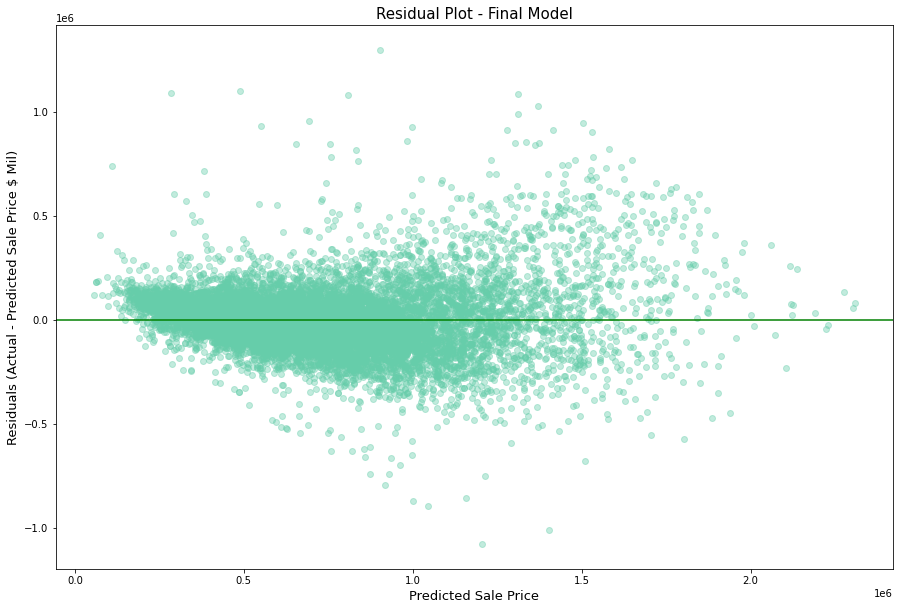

In [330]:
# X_int9 = sm.add_constant(X_train9)
# model9 = sm.OLS(y_train9, X_int9).fit()
# model9.summary()
# y_pred9 = linreg9.predict(X_train9)
# # # Create a matplotlib figure
# plt.figure(figsize=(15, 10))
# # Create a scatter plot
# plt.scatter(y_train9, y_pred9, label='Actual', color='mediumaquamarine')
# plt.plot(y_pred9, y_pred9, label='Predicted', color='green')
# plt.xlabel('Actual House Price $MM dollars', fontsize=15)
# plt.ylabel('Predicted House Price ($MM dollars)', fontsize=15)
# plt.title('Final Model Predictions vs. actual', fontsize=15)
# plt.legend()

# plt.show()


plt.figure(figsize=(15,10))
plt.axhline(y = 0, color = 'green', linestyle = '-')
plt.ylabel("Residuals (Actual - Predicted Sale Price $ Mil)", fontsize=13)
plt.xlabel("Predicted Sale Price", fontsize=13)
plt.scatter(x=y_pred9, y=y_train9-y_pred9, alpha=0.4, color='mediumaquamarine');
plt.title('Residual Plot - Final Model', fontsize=15)
plt.savefig('modelvsactual.png')
plt.show()

<ipython-input-345-e1cd71c1eb98>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


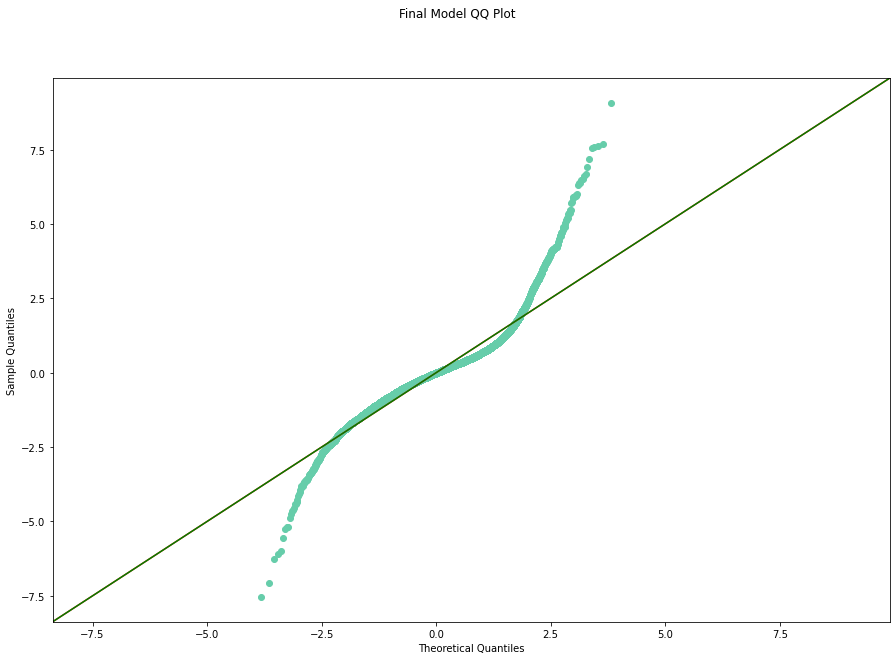

In [345]:
fig, ax = plt.subplots(figsize=(15, 10))
residuals9 = model9.resid
fig = sm.graphics.qqplot(residuals9, line='45',markerfacecolor='mediumaquamarine', markeredgecolor='mediumaquamarine',\
                          fit=True, ax=ax)
fig.suptitle('Final Model QQ Plot', fontsize=12)
sm.qqline(fig.axes[0], line='45', fmt='green')
fig.show()
fig.savefig('qq.png')

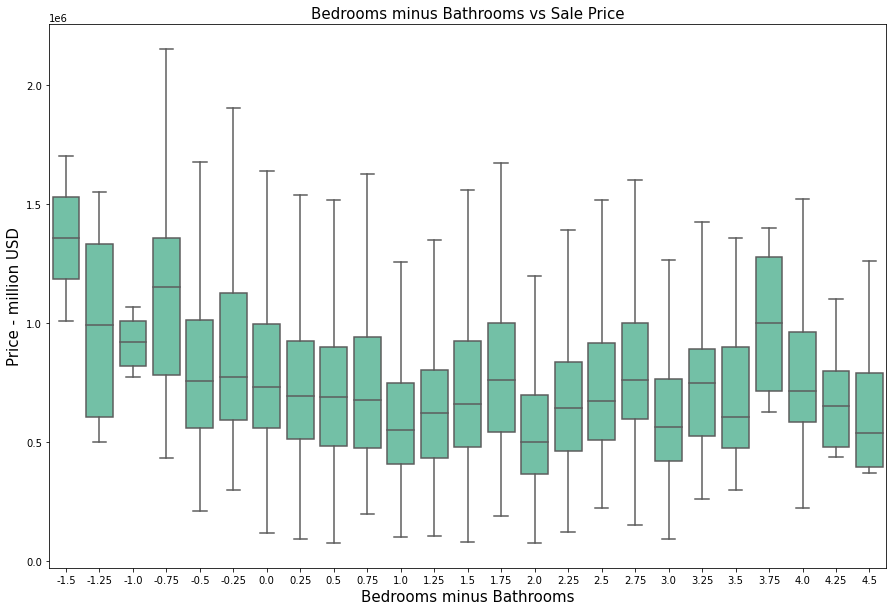

In [319]:
plt.figure(figsize=(15,10))
plt.title('Bedrooms minus Bathrooms vs Sale Price', fontsize=15)
plt.ylabel('Price - million USD', fontsize=15)
plt.xlabel('Bedrooms minus Bathrooms', fontsize=15)
boxplot = sns.boxplot(x='bedbath', y="SalePrice", data=df9, showfliers=False, color='mediumaquamarine')
boxplot.set(xlabel='Bedrooms minus Bathrooms',ylabel='Price - million USD');
plt.savefig('bedroomsvsbathrooms.png')



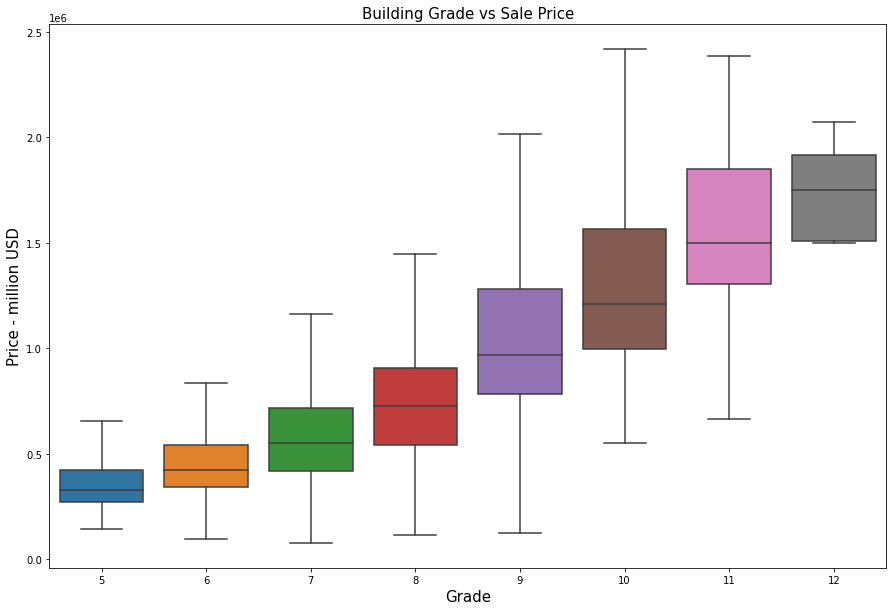

In [320]:
plt.figure(figsize=(15,10))
plt.title('Building Grade vs Sale Price', fontsize=15)
plt.ylabel('Price - million USD', fontsize=15)
plt.xlabel('Bedrooms minus Bathrooms', fontsize=15)
boxplot = sns.boxplot(x='BldgGrade', y="SalePrice", data=df9, showfliers=False)
boxplot.set(xlabel='Grade',ylabel='Price - million USD');
plt.savefig('bldggrade.png')

In [321]:
import json

In [322]:
data_geo = df12.groupby('ZipCode')[['SalePrice']].mean().reset_index()
data_geo['ZipCode'] = data_geo['ZipCode'].astype(str)


In [323]:
data_geo = df12.groupby('ZipCode')[['SalePrice']].mean().reset_index()
data_geo['ZipCode'] = data_geo['ZipCode'].astype(str)


# count number of houses grouped by zipcode
df12['count'] = 1
temp = df12.groupby('ZipCode').sum()
temp.reset_index(inplace = True)
temp = temp[['ZipCode', 'count']]
data_geo = pd.merge(data_geo, temp, on='ZipCode')
# drop count from org dataset
df12.drop(['count'], axis = 1, inplace = True)


king_county_geo = '..\..\Zip_Codes.geojson'
with open(king_county_geo, 'r') as j:
    geo_data = json.load(j)


tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZIPCODE'] in list(data_geo['ZipCode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save updated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))



14976118

In [324]:
map_feature_by_zipcode(data_geo, 'SalePrice')

C:\Users\Andrew\anaconda3\envs\geo-env\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [325]:
get_map(large_delta)